#Instalacija potrebnih biblioteka i postavljanje okruženja


In [1]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 27.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 49.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 71.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 98.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

Karakteristike okruženja na kojem se vrši treniranje

In [2]:
import torch
from ultralytics import YOLO
import os

# Provjera da li je GPU dostupan
print("GPU dostupan:", torch.cuda.is_available())
if torch.cuda.is_available():
    !nvidia-smi
else:
    print("Upozorenje: GPU nije dostupan. Treniranje će biti veoma sporo.")
    print("U Colab-u, idite na 'Runtime' -> 'Change runtime type' i izaberite 'GPU' kao hardverski akcelerator.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
GPU dostupan: True
Sun Jun 22 12:51:04 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+==================

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Otpakivanje i provjera sadržaja dataseta
import os
import zipfile

# Putanja do tvog uploadovanog ZIP fajla
zip_path = '/content/drive/MyDrive/VI-Projekat/yolo_dataset.zip'
extract_path = '/content/yolo_data_raw'
show_path = '/content/yolo_data_raw/yolo_dataset'


# Kreiranje direktorijuma za otpakivanje ako ne postoji
os.makedirs(extract_path, exist_ok=True)

# Otpakivanje ZIP fajla
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Dataset otpakovan u: {extract_path}")
print("Sadržaj direktorijuma:")
!ls -U {show_path} | head -n 10

Dataset otpakovan u: /content/yolo_data_raw
Sadržaj direktorijuma:
train
test
val


#Pregled dataseta

In [ ]:
import os
from collections import Counter

# Define the base directory where your 'train', 'val', 'test' folders are
# Based on your input, this is '/content/yolo_data_raw/yolo_dataset'
base_data_path = '/content/yolo_data_raw/yolo_dataset'

dataset_splits = {
    'train': os.path.join(base_data_path, 'train', 'labels'),
    'val': os.path.join(base_data_path, 'val', 'labels'),
    'test': os.path.join(base_data_path, 'test', 'labels')
}

class_names = {0: 'bear_juvenile', 1: 'bear_adult'}
overall_class_counts = Counter()
results = {}
total_images_overall = 0 # Inicijalizacija brojača za ukupan broj slika u cijelom datasetu

print("--- Analiza Dataset Splitova i Balansa Klasa ---")

for split_name, labels_path in dataset_splits.items():
    split_class_counts = Counter()
    total_images_in_split = 0

    if not os.path.exists(labels_path):
        print(f"\nUPOZORENJE: Folder '{labels_path}' ne postoji za '{split_name}' set. Preskačem.")
        results[split_name] = {
            'total_images': 0,
            'class_counts': split_class_counts
        }
        continue

    for filename in os.listdir(labels_path):
        if filename.endswith('.txt'):
            total_images_in_split += 1
            with open(os.path.join(labels_path, filename), 'r') as f:
                for line in f:
                    try:
                        # The first number in the line is the class index
                        class_id = int(line.split()[0])
                        split_class_counts[class_id] += 1
                        overall_class_counts[class_id] += 1
                    except (ValueError, IndexError):
                        print(f"Upozorenje: Problem sa parsiranjem linije u datoteci {filename}: {line.strip()}")
                        continue

    results[split_name] = {
        'total_images': total_images_in_split,
        'class_counts': split_class_counts
    }
    total_images_overall += total_images_in_split # Dodavanje broja slika iz trenutnog splita

    print(f"\n--- {split_name.upper()} Set ---")
    print(f"Ukupan broj slika/labela: {total_images_in_split}")

    if split_class_counts:
        total_instances_in_split = sum(split_class_counts.values())
        if total_instances_in_split > 0:
            for class_id, count in sorted(split_class_counts.items()):
                percentage = (count / total_instances_in_split) * 100
                print(f"Klasa '{class_names.get(class_id, 'Nepoznata')}': {count} instanci ({percentage:.2f}%)")
        else:
            print("Nema pronađenih instanci objekata u ovom setu.")
    else:
        print("Nema pronađenih instanci objekata u ovom setu.")

# --- Ukupan broj slika u cijelom datasetu ---
print(f"\n--- Ukupan broj slika u cijelom datasetu: {total_images_overall} ---")

--- Analiza Dataset Splitova i Balansa Klasa ---

--- TRAIN Set ---
Ukupan broj slika/labela: 9561
Klasa 'bear_juvenile': 5306 instanci (43.61%)
Klasa 'bear_adult': 6860 instanci (56.39%)

--- VAL Set ---
Ukupan broj slika/labela: 1195
Klasa 'bear_juvenile': 588 instanci (39.30%)
Klasa 'bear_adult': 908 instanci (60.70%)

--- TEST Set ---
Ukupan broj slika/labela: 1196
Klasa 'bear_juvenile': 645 instanci (43.52%)
Klasa 'bear_adult': 837 instanci (56.48%)

--- Ukupan broj slika u cijelom datasetu: 11952 ---


Prikaz par primjera slika iz dataseta

In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image
from collections import Counter


base_data_path = '/content/yolo_data_raw/yolo_dataset'
train_images_path = os.path.join(base_data_path, 'train', 'images')
train_labels_path = os.path.join(base_data_path, 'train', 'labels')


class_names = {0: 'bear_juvenile', 1: 'bear_adult'}


if not os.path.exists(train_images_path):
    print(f"Greška: Folder sa slikama za train set ne postoji na putanji: {train_images_path}")
elif not os.path.exists(train_labels_path):
    print(f"Greška: Folder sa labelama za train set ne postoji na putanji: {train_labels_path}")
else:

    image_files = [f for f in os.listdir(train_images_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    if not image_files:
        print(f"Nema pronađenih slika u folderu: {train_images_path}")
    else:

        num_images_to_show = min(5, len(image_files))
        random_images = random.sample(image_files, num_images_to_show)

        print(f"Prikazujem {num_images_to_show} nasumičnih slika iz train seta i njihove labele:")


        fig, axes = plt.subplots(num_images_to_show, 1, figsize=(10, num_images_to_show * 5)) # Podesite veličinu figure po potrebi


        if num_images_to_show == 1:
            axes = [axes]

        for i, img_name in enumerate(random_images):
            img_path = os.path.join(train_images_path, img_name)


            label_file_name = os.path.splitext(img_name)[0] + '.txt'
            label_path = os.path.join(train_labels_path, label_file_name)

            current_image_class_counts = Counter()


            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f:
                        try:

                            class_id = int(line.split()[0])
                            current_image_class_counts[class_id] += 1
                        except (ValueError, IndexError):
                            print(f"Upozorenje: Problem sa parsiranjem linije u datoteci labela {label_file_name}: {line.strip()}")
                            continue
            else:
                print(f"Upozorenje: Labela za sliku {img_name} ({label_file_name}) ne postoji.")


            labels_info = []
            instances_info = []

            if current_image_class_counts:
                for class_id, count in sorted(current_image_class_counts.items()):
                    class_label = class_names.get(class_id, f'Nepoznata klasa ({class_id})')
                    labels_info.append(class_label)
                    instances_info.append(f"{class_label}: {count}")
            else:
                labels_info.append("Nema detektovanih objekata")


            info_text = f"--- Slika: {img_name} ---\n"
            info_text += f"Labele na slici: {', '.join(labels_info)}\n"
            info_text += f"Broj instanci: {', '.join(instances_info) if instances_info else 'Nema instanci'}"


            print(f"\n{info_text}")


            try:
                img = Image.open(img_path)
                axes[i].imshow(img)

                axes[i].set_title(info_text, loc='left', wrap=True, fontsize=10)
                axes[i].axis('off')
            except Exception as e:
                print(f"Greška pri učitavanju slike {img_name}: {e}")
                axes[i].set_title(f"Greška: {img_name}", loc='left')
                axes[i].axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#Kreiranje data.yaml fajla na osnovu postojeće strukture
import os

# Putanja do glavnog foldera tvog dataseta
dataset_path = '/content/yolo_data_raw/yolo_dataset'

# Definišemo sadržaj YAML fajla
# Putevi su sada relativni u odnosu na content folder
yaml_content = f"""
train: {dataset_path}/train/images
val: {dataset_path}/val/images
test: {dataset_path}/test/images

# Broj klasa
nc: 2

# Imena klasa
# Indeks 0 -> bear_juvenile
# Indeks 1 -> bear_adult
names: ['bear_juvenile', 'bear_adult']
"""

# Putanja gdje ćemo sačuvati YAML fajl
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

with open(yaml_file_path, 'w') as f:
    f.write(yaml_content)

print(f"data.yaml fajl je uspešno kreiran na lokaciji: {yaml_file_path}")
print("\nSadržaj fajla:")
!cat {yaml_file_path}

data.yaml fajl je uspešno kreiran na lokaciji: /content/yolo_data_raw/yolo_dataset/data.yaml

Sadržaj fajla:

train: /content/yolo_data_raw/yolo_dataset/train/images
val: /content/yolo_data_raw/yolo_dataset/val/images
test: /content/yolo_data_raw/yolo_dataset/test/images

# Broj klasa
nc: 2

# Imena klasa
# Indeks 0 -> bear_juvenile
# Indeks 1 -> bear_adult
names: ['bear_juvenile', 'bear_adult']


Broj instanci u datasetu

In [ ]:
import os
from collections import Counter

# Putanja do foldera sa svim labelama (i iz train i iz val)
labels_paths = [
    '/content/yolo_data_raw/yolo_dataset/train/labels',
    '/content/yolo_data_raw/yolo_dataset/val/labels',
   # '/content/yolo_data_raw/yolo_dataset/test/labels'
]

class_counts = Counter()

# Prođi kroz sve foldere sa labelama
for path in labels_paths:
    if not os.path.exists(path):
        continue

    for filename in os.listdir(path):
        if filename.endswith('.txt'):
            with open(os.path.join(path, filename), 'r') as f:
                for line in f:
                    # Prvi broj u redu je indeks klase
                    class_id = int(line.split()[0])
                    class_counts[class_id] += 1


# 0: bear_juvenile, 1: bear_adult
class_names = {0: 'bear_juvenile', 1: 'bear_adult'}

print("--- Analiza Balansa Klasa ---")
if not class_counts:
    print("Nije pronađena nijedna labela. Proverite putanje.")
else:
    total_instances = sum(class_counts.values())
    for class_id, count in sorted(class_counts.items()):
        percentage = (count / total_instances) * 100
        print(f"Klasa '{class_names.get(class_id, 'Nepoznata')}': {count} instanci ({percentage:.2f}%)")

    if abs(class_counts[0] - class_counts[1]) / total_instances > 0.2:
        print("\nUPOZORENJE: Dataset je značajno neuravnotežen. Ovo može negativno uticati na performanse modela.")
    else:
        print("\nINFO: Dataset je relativno dobro balansiran.")

--- Analiza Balansa Klasa ---
Klasa 'bear_juvenile': 5894 instanci (43.14%)
Klasa 'bear_adult': 7768 instanci (56.86%)

INFO: Dataset je relativno dobro balansiran.


In [ ]:
#Čuvanje napretka direktno na Google Drive
from ultralytics import YOLO
import os


DRIVE_PROJECT_PATH = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project'
os.makedirs(DRIVE_PROJECT_PATH, exist_ok=True) # Kreiraj folder ako ne postoji

# Putanja do data.yaml ostaje ista
data_config_path = '/content/yolo_data_raw/yolo_dataset/data.yaml'

# --- Učitavanje Modela ---
model = YOLO('yolov8m.pt')

# --- Pokretanje Treninga ---
results = model.train(
    data=data_config_path,
    epochs=100,
    patience=25,
    save_period=5,
    imgsz=640,
    project=DRIVE_PROJECT_PATH,
    name='run_medium_on_drive',
    exist_ok=False
)

Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_data_raw/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=run_medium_on_drive, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=25, perspective=0.0, plo

train: Scanning /content/yolo_data_raw/yolo_dataset/train/labels.cache... 9561 images, 1456 backgrounds, 0 corrupt: 100%|██████████| 9561/9561 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 621.2±383.9 MB/s, size: 339.4 KB)


val: Scanning /content/yolo_data_raw/yolo_dataset/val/labels.cache... 1195 images, 186 backgrounds, 0 corrupt: 100%|██████████| 1195/1195 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      10.6G     0.7572     0.7597      1.064         20        640: 100%|██████████| 598/598 [05:33<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:16<00:00,  2.33it/s]

                   all       1195       1496      0.986      0.977      0.994      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      10.2G     0.6605     0.4262      0.982         20        640: 100%|██████████| 598/598 [05:27<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:16<00:00,  2.36it/s]

                   all       1195       1496      0.978      0.974      0.991      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      10.1G     0.6993     0.4659      1.009         22        640: 100%|██████████| 598/598 [05:25<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:15<00:00,  2.44it/s]

                   all       1195       1496      0.965      0.969      0.991      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      10.1G     0.7169     0.4846      1.025         31        640: 100%|██████████| 598/598 [05:24<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:15<00:00,  2.46it/s]


                   all       1195       1496      0.905      0.864      0.923       0.78

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      10.2G     0.6804     0.4481      1.014         21        640: 100%|██████████| 598/598 [05:22<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:15<00:00,  2.48it/s]

                   all       1195       1496       0.97      0.994      0.994      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      10.1G     0.6339     0.4106     0.9877         20        640: 100%|██████████| 598/598 [05:22<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:15<00:00,  2.49it/s]

                   all       1195       1496      0.979       0.99      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      10.2G     0.6178     0.3947     0.9819         29        640: 100%|██████████| 598/598 [05:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.55it/s]

                   all       1195       1496      0.986      0.985      0.994      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      10.1G     0.5841     0.3677     0.9686         19        640: 100%|██████████| 598/598 [05:22<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.54it/s]


                   all       1195       1496      0.985      0.994      0.993       0.91

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      10.2G     0.5674     0.3545     0.9601         14        640: 100%|██████████| 598/598 [05:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.54it/s]

                   all       1195       1496      0.984      0.987      0.994      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      10.1G     0.5516     0.3442     0.9507         28        640: 100%|██████████| 598/598 [05:22<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.54it/s]

                   all       1195       1496      0.987      0.991      0.995      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      10.2G      0.531     0.3281     0.9448         23        640: 100%|██████████| 598/598 [05:22<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.54it/s]

                   all       1195       1496      0.979      0.988      0.994       0.92



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      10.1G     0.5242     0.3236     0.9419         12        640: 100%|██████████| 598/598 [05:21<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.54it/s]

                   all       1195       1496       0.99      0.991      0.995      0.927



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      10.2G     0.5099     0.3129     0.9358         22        640: 100%|██████████| 598/598 [05:22<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.56it/s]

                   all       1195       1496      0.984      0.991      0.994      0.934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      10.1G     0.4986     0.3071     0.9272         28        640: 100%|██████████| 598/598 [05:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.57it/s]

                   all       1195       1496      0.991      0.989      0.994      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      10.2G     0.4901      0.299      0.925         28        640: 100%|██████████| 598/598 [05:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.56it/s]

                   all       1195       1496      0.987      0.988      0.994      0.936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      10.1G     0.4799     0.2971     0.9235         19        640: 100%|██████████| 598/598 [05:22<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.59it/s]

                   all       1195       1496      0.992      0.984      0.994      0.943



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      10.2G     0.4691     0.2875     0.9159         24        640: 100%|██████████| 598/598 [05:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.59it/s]

                   all       1195       1496      0.989      0.997      0.995      0.945



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      10.1G     0.4669     0.2839     0.9166         12        640: 100%|██████████| 598/598 [05:22<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.60it/s]


                   all       1195       1496       0.99      0.995      0.994      0.944

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      10.2G     0.4566     0.2767     0.9087         23        640: 100%|██████████| 598/598 [05:22<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:15<00:00,  2.52it/s]

                   all       1195       1496      0.991      0.998      0.995       0.95



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      10.1G     0.4519      0.274     0.9084         18        640: 100%|██████████| 598/598 [05:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.59it/s]

                   all       1195       1496      0.987      0.999      0.994      0.953



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      10.2G     0.4485     0.2705     0.9045         20        640: 100%|██████████| 598/598 [05:22<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.59it/s]

                   all       1195       1496      0.993       0.99      0.995      0.954



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      10.1G     0.4402     0.2645        0.9         29        640: 100%|██████████| 598/598 [05:22<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.60it/s]

                   all       1195       1496      0.989      0.996      0.995      0.952



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      10.2G     0.4379     0.2635     0.9022         22        640: 100%|██████████| 598/598 [05:20<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.58it/s]

                   all       1195       1496      0.991      0.995      0.995      0.957



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.1G     0.4271     0.2605     0.8995         19        640: 100%|██████████| 598/598 [05:22<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.60it/s]

                   all       1195       1496      0.993      0.993      0.995      0.961



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      10.2G     0.4277     0.2589     0.8962         39        640: 100%|██████████| 598/598 [05:21<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.58it/s]

                   all       1195       1496      0.992      0.993      0.995      0.959



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      10.1G     0.4173     0.2524     0.8907         35        640: 100%|██████████| 598/598 [05:22<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.55it/s]

                   all       1195       1496      0.991      0.997      0.995       0.96



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      10.2G     0.4149     0.2499     0.8902         23        640: 100%|██████████| 598/598 [05:22<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.55it/s]

                   all       1195       1496      0.994      0.997      0.995      0.965



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      10.1G     0.4059     0.2457     0.8863         31        640: 100%|██████████| 598/598 [05:22<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.57it/s]

                   all       1195       1496      0.991      0.999      0.995      0.962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      10.2G     0.4015     0.2415     0.8857         14        640: 100%|██████████| 598/598 [05:20<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.55it/s]

                   all       1195       1496      0.994      0.991      0.995      0.964



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.1G     0.4047     0.2411     0.8883         32        640:  83%|████████▎ | 495/598 [04:25<00:52,  1.96it/s]

Nastavak treniranja od iste tačke do koje se došlo u prethodnoj sesiji

In [ ]:
from ultralytics import YOLO

# Putanja do poslednjeg sačuvanog checkpoint-a na tvom Drive-u
# 'last.pt' uvek pokazuje na težine iz poslednje završene epohe
last_checkpoint_path = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/last.pt'

# Učitaj model sa stanjem iz poslednjeg checkpoint-a
model = YOLO(last_checkpoint_path)

print("Nastavljam prekinuti trening...")
model.train(resume=True)

print("Trening je uspešno nastavljen i završen.")

Nastavljam prekinuti trening...
Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_data_raw/yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=run_medium_on_drive, 

100%|██████████| 755k/755k [00:00<00:00, 23.9MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics.nn.modules.conv.Conv             [384

100%|██████████| 5.35M/5.35M [00:00<00:00, 105MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 464.2±531.7 MB/s, size: 446.2 KB)


train: Scanning /content/yolo_data_raw/yolo_dataset/train/labels... 9561 images, 1456 backgrounds, 0 corrupt: 100%|██████████| 9561/9561 [00:15<00:00, 605.25it/s] 


train: New cache created: /content/yolo_data_raw/yolo_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1271.2±1342.9 MB/s, size: 339.4 KB)


val: Scanning /content/yolo_data_raw/yolo_dataset/val/labels... 1195 images, 186 backgrounds, 0 corrupt: 100%|██████████| 1195/1195 [00:00<00:00, 1811.80it/s]

val: New cache created: /content/yolo_data_raw/yolo_dataset/val/labels.cache


Plotting labels to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Resuming training /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/last.pt from epoch 66 to 100 total epochs
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100       6.2G     0.2876     0.1693     0.8412         20        640: 100%|██████████| 598/598 [05:09<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:16<00:00,  2.28it/s]

                   all       1195       1496      0.995      0.999      0.995      0.982



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.14G     0.2884     0.1717     0.8394         20        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.78it/s]

                   all       1195       1496      0.994      0.999      0.995      0.982



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.19G     0.2911     0.1725     0.8404         22        640: 100%|██████████| 598/598 [05:13<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.85it/s]


                   all       1195       1496      0.995      0.999      0.995      0.982

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      7.23G     0.2905     0.1714     0.8427         31        640: 100%|██████████| 598/598 [05:13<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.82it/s]

                   all       1195       1496      0.994      0.999      0.995      0.983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.28G     0.2874     0.1693     0.8409         21        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.82it/s]

                   all       1195       1496      0.994      0.999      0.995      0.983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      7.32G     0.2812     0.1675     0.8372         20        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.82it/s]

                   all       1195       1496      0.994      0.999      0.995      0.983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.37G     0.2827     0.1687     0.8362         29        640: 100%|██████████| 598/598 [05:12<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.82it/s]

                   all       1195       1496      0.994      0.999      0.995      0.983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.41G     0.2756     0.1637      0.835         19        640: 100%|██████████| 598/598 [05:12<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.83it/s]

                   all       1195       1496      0.994      0.999      0.995      0.983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      7.31G     0.2737     0.1628     0.8346         14        640: 100%|██████████| 598/598 [05:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.86it/s]

                   all       1195       1496      0.994      0.999      0.995      0.983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.31G     0.2729     0.1614     0.8346         28        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.87it/s]

                   all       1195       1496      0.995      0.999      0.995      0.983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.33G     0.2708     0.1612     0.8344         23        640: 100%|██████████| 598/598 [05:12<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.87it/s]

                   all       1195       1496      0.995      0.999      0.995      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.38G     0.2647     0.1588     0.8342         12        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.83it/s]

                   all       1195       1496      0.994      0.999      0.995      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      6.14G     0.2675     0.1585     0.8345         22        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.80it/s]


                   all       1195       1496      0.995      0.999      0.995      0.984

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.17G     0.2605     0.1558     0.8302         28        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.83it/s]

                   all       1195       1496      0.994          1      0.995      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.21G     0.2599     0.1526     0.8326         28        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.80it/s]


                   all       1195       1496      0.994          1      0.995      0.984

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.26G     0.2574     0.1521     0.8314         19        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.88it/s]

                   all       1195       1496      0.994          1      0.995      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       6.3G     0.2543     0.1527     0.8296         24        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.83it/s]

                   all       1195       1496      0.994          1      0.995      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.35G     0.2514     0.1503     0.8271         12        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.86it/s]

                   all       1195       1496      0.994          1      0.995      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.76G     0.2476     0.1471     0.8252         23        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.83it/s]

                   all       1195       1496      0.994          1      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.81G     0.2465     0.1474     0.8272         18        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.78it/s]

                   all       1195       1496      0.994          1      0.995      0.984



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.85G     0.2462     0.1455     0.8256         20        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.81it/s]

                   all       1195       1496      0.994          1      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100       6.9G     0.2421     0.1428     0.8259         29        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.83it/s]

                   all       1195       1496      0.994          1      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.94G     0.2398     0.1412     0.8223         22        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.83it/s]

                   all       1195       1496      0.994          1      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.98G     0.2339     0.1376     0.8236         19        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.83it/s]

                   all       1195       1496      0.994          1      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      7.03G     0.2372     0.1389     0.8233         39        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.84it/s]

                   all       1195       1496      0.994          1      0.995      0.985


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      7.21G     0.2122     0.1205     0.7938         14        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.84it/s]

                   all       1195       1496      0.994          1      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.29G     0.2083     0.1198     0.7912          8        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.84it/s]

                   all       1195       1496      0.994          1      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.29G     0.2045     0.1178      0.792          8        640: 100%|██████████| 598/598 [05:09<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.79it/s]

                   all       1195       1496      0.994          1      0.995      0.985



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.29G     0.2009      0.115     0.7895          9        640: 100%|██████████| 598/598 [05:10<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.83it/s]

                   all       1195       1496      0.994          1      0.995      0.986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.29G     0.1979     0.1118     0.7887         16        640: 100%|██████████| 598/598 [05:10<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.81it/s]

                   all       1195       1496      0.994          1      0.995      0.986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.29G     0.1941     0.1109     0.7903         13        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.90it/s]

                   all       1195       1496      0.994          1      0.995      0.986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       6.3G     0.1934     0.1088     0.7871         15        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.82it/s]

                   all       1195       1496      0.994          1      0.995      0.986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.34G     0.1886     0.1068     0.7871         14        640: 100%|██████████| 598/598 [05:09<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.88it/s]

                   all       1195       1496      0.994          1      0.995      0.986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.45G     0.1863     0.1044      0.787          9        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.82it/s]

                   all       1195       1496      0.994          1      0.995      0.986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.53G     0.1839     0.1028     0.7859         11        640: 100%|██████████| 598/598 [05:09<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.84it/s]

                   all       1195       1496      0.994          1      0.995      0.986



35 epochs completed in 3.179 hours.
Optimizer stripped from /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/best.pt...
Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:16<00:00,  2.26it/s]


                   all       1195       1496      0.994          1      0.995      0.986
         bear_juvenile        372        588      0.995          1      0.995      0.986
            bear_adult        796        908      0.993      0.999      0.995      0.987
Speed: 0.2ms preprocess, 5.6ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive
Trening je uspešno nastavljen i završen.


NAPOMENA: U slučaju da se dataset updatuje

Ovo se može pokrenuti u slučaju da želimo dotrenirati model nakon prvobitnih 100 epoha.

In [ ]:


from ultralytics import YOLO
import os

DRIVE_PROJECT_PATH = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project'
DATA_CONFIG_PATH = '/content/yolo_data_raw/yolo_dataset/data.yaml'


model_to_finetune_path = os.path.join(DRIVE_PROJECT_PATH, 'run_medium_on_drive', 'weights/best.pt')
new_run_name = 'run_medium_finetune_low_lr'
model = YOLO(model_to_finetune_path)

print(f"Model {model_to_finetune_path} učitan. Počinjem fazu finog podešavanja...")



model.train(
    data=DATA_CONFIG_PATH,
    epochs=30,
    lr0=0.001,
    patience=10,
    degrees=15.0,
    fliplr=0.6,
    imgsz=640,
    project=DRIVE_PROJECT_PATH,
    name=new_run_name,
    exist_ok=True
)

print(f"\nFino podešavanje je završeno. Rezultati su u folderu: {new_run_name}")

Model /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/best.pt učitan. Počinjem fazu finog podešavanja...
Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/yolo_data_raw/yolo_dataset/data.yaml, degrees=15.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.6, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/VI-Projekat/Bear_Detection_Projec

100%|██████████| 755k/755k [00:00<00:00, 35.9MB/s]


                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics.nn.modules.conv.Conv             [384

 12                  -1  2   1993728  ultralytics.nn.modules.block.C2f             [960, 384, 2]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  2    517632  ultralytics.nn.modules.block.C2f             [576, 192, 2]                 
 16                  -1  1    332160  ultralytics.nn.modules.conv.Conv             [192, 192, 3, 2]              
 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 18                  -1  2   1846272  ultralytics.nn.modules.block.C2f             [576, 384, 2]                 
 19                  -1  1   1327872  ultralytics.nn.modules.conv.Conv             [384, 384, 3, 2]              
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]  

100%|██████████| 5.35M/5.35M [00:00<00:00, 124MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 510.8±577.8 MB/s, size: 446.2 KB)


train: Scanning /content/yolo_data_raw/yolo_dataset/train/labels... 9561 images, 1456 backgrounds, 0 corrupt: 100%|██████████| 9561/9561 [00:15<00:00, 627.70it/s] 


train: New cache created: /content/yolo_data_raw/yolo_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1320.2±801.6 MB/s, size: 339.4 KB)


val: Scanning /content/yolo_data_raw/yolo_dataset/val/labels... 1195 images, 186 backgrounds, 0 corrupt: 100%|██████████| 1195/1195 [00:00<00:00, 1561.32it/s]

val: New cache created: /content/yolo_data_raw/yolo_dataset/val/labels.cache


Plotting labels to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_finetune_low_lr/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_finetune_low_lr
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.12G     0.7023     0.3311      1.075         20        640: 100%|██████████| 598/598 [05:22<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:16<00:00,  2.35it/s]

                   all       1195       1496      0.991      0.987      0.995        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      7.09G     0.6856     0.3893      1.064         23        640: 100%|██████████| 598/598 [05:19<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.66it/s]

                   all       1195       1496      0.983      0.992      0.994      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      7.16G     0.6886     0.4057      1.069         21        640: 100%|██████████| 598/598 [05:16<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.74it/s]

                   all       1195       1496      0.983      0.972      0.993       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      7.23G     0.6832     0.3992      1.069         31        640: 100%|██████████| 598/598 [05:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.73it/s]

                   all       1195       1496      0.984      0.977      0.994      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      7.29G     0.6375     0.3703      1.044         23        640: 100%|██████████| 598/598 [05:15<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.71it/s]

                   all       1195       1496      0.993      0.987      0.994      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      7.36G     0.6045      0.351      1.024         22        640: 100%|██████████| 598/598 [05:16<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.76it/s]


                   all       1195       1496      0.983      0.993      0.994       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      6.53G     0.5873      0.342      1.012         31        640: 100%|██████████| 598/598 [05:15<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.76it/s]

                   all       1195       1496      0.991      0.992      0.994      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      6.26G     0.5584     0.3194     0.9966         18        640: 100%|██████████| 598/598 [05:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.71it/s]

                   all       1195       1496      0.989      0.996      0.994      0.919



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      7.23G     0.5463     0.3142     0.9834         16        640: 100%|██████████| 598/598 [05:15<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.73it/s]

                   all       1195       1496      0.986      0.998      0.994      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      7.29G     0.5319     0.3021     0.9787         31        640: 100%|██████████| 598/598 [05:15<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.71it/s]

                   all       1195       1496      0.991      0.992      0.995      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.36G     0.5143     0.2927     0.9726         22        640: 100%|██████████| 598/598 [05:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.73it/s]

                   all       1195       1496      0.994      0.993      0.995      0.926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      6.34G     0.5017     0.2894     0.9634         12        640: 100%|██████████| 598/598 [05:16<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.73it/s]

                   all       1195       1496      0.988       0.99      0.995      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      7.27G     0.4875     0.2841      0.956         22        640: 100%|██████████| 598/598 [05:15<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.73it/s]

                   all       1195       1496      0.995      0.994      0.995      0.932



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      7.33G      0.472     0.2723     0.9473         27        640: 100%|██████████| 598/598 [05:15<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.68it/s]

                   all       1195       1496       0.99      0.993      0.995      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      6.42G     0.4653     0.2663     0.9465         29        640: 100%|██████████| 598/598 [05:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.76it/s]

                   all       1195       1496      0.995      0.996      0.995      0.936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      7.34G     0.4561      0.258      0.942         21        640: 100%|██████████| 598/598 [05:16<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.74it/s]

                   all       1195       1496      0.991      0.995      0.995      0.938



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      6.39G     0.4444      0.255     0.9377         25        640: 100%|██████████| 598/598 [05:15<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.80it/s]

                   all       1195       1496      0.991      0.999      0.995      0.949



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      7.34G     0.4334     0.2455     0.9325         13        640: 100%|██████████| 598/598 [05:15<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.80it/s]

                   all       1195       1496      0.993      0.999      0.995      0.955



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      6.38G     0.4242     0.2407     0.9226         25        640: 100%|██████████| 598/598 [05:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.80it/s]

                   all       1195       1496      0.994      0.999      0.995      0.942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      7.33G     0.4137     0.2358     0.9234         19        640: 100%|██████████| 598/598 [05:13<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.75it/s]

                   all       1195       1496      0.993      0.997      0.995      0.943


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30       7.4G     0.3511     0.1962     0.8765         11        640: 100%|██████████| 598/598 [05:14<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.79it/s]


                   all       1195       1496      0.994      0.996      0.995      0.935

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      6.17G     0.3376     0.1848     0.8665          8        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.79it/s]

                   all       1195       1496      0.995      0.998      0.995      0.955



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      6.61G     0.3267     0.1785     0.8601         11        640: 100%|██████████| 598/598 [05:11<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.81it/s]


                   all       1195       1496      0.995      0.999      0.995      0.949

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      6.68G     0.3199     0.1721      0.856         13        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.84it/s]

                   all       1195       1496      0.995      0.998      0.995      0.955



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      6.75G      0.308     0.1671     0.8496         14        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.70it/s]

                   all       1195       1496      0.995      0.995      0.995      0.964



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      6.81G     0.2975     0.1604     0.8458         14        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.77it/s]


                   all       1195       1496      0.995      0.998      0.995      0.961

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      6.88G     0.2883     0.1553     0.8385          8        640: 100%|██████████| 598/598 [05:12<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.75it/s]

                   all       1195       1496      0.994          1      0.995      0.967



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      6.94G     0.2812     0.1509     0.8387          8        640: 100%|██████████| 598/598 [05:13<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:14<00:00,  2.71it/s]

                   all       1195       1496      0.996      0.997      0.995      0.966



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      7.38G     0.2698     0.1472      0.831          9        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.79it/s]

                   all       1195       1496      0.996      0.999      0.995      0.969



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      6.21G     0.2596     0.1411     0.8283         15        640: 100%|██████████| 598/598 [05:12<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:13<00:00,  2.79it/s]


                   all       1195       1496      0.995      0.999      0.995       0.97

30 epochs completed in 2.754 hours.
Optimizer stripped from /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_finetune_low_lr/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_finetune_low_lr/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_finetune_low_lr/weights/best.pt...
Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:16<00:00,  2.34it/s]


                   all       1195       1496      0.995      0.999      0.995       0.97
         bear_juvenile        372        588      0.997      0.998      0.995       0.97
            bear_adult        796        908      0.994          1      0.995      0.969
Speed: 0.2ms preprocess, 5.6ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_finetune_low_lr

Fino podešavanje je završeno. Rezultati su u folderu: run_medium_finetune_low_lr


#Iteracija kroz cijeli Test Set i prikaz svih rezultata

Rezultati će biti sačuvani u: /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/test_set_predictions

Pronađeno 1196 slika u test setu. Počinjem predikciju...

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1196 /content/yolo_data_raw/yolo_dataset/test/images/bear_video_000_frame_0006_EZ.jpg: 384x640 2 bear_juveniles, 93.0ms
image 2/1196 /content/yolo_data_raw/yolo_dataset/test/images/bear_video_000_frame_0009_EZ.jpg: 384x640 2 bear_juveniles, 25.1ms
image 3/1196 /content/yolo_data_r

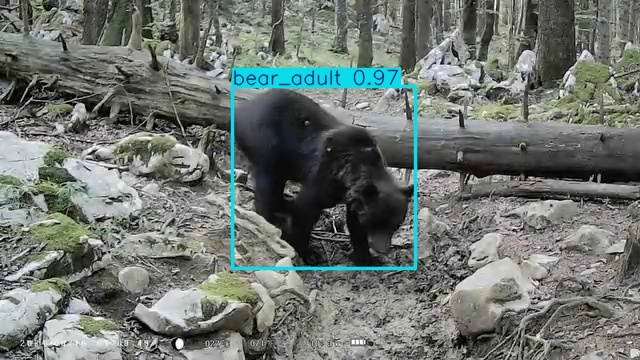


Rezultat za sliku: bear_video_020_frame_0268_BB.jpg


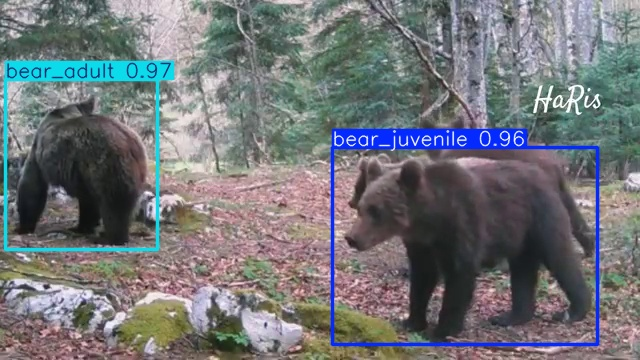


Rezultat za sliku: bear_video_019_frame_0134_BB.jpg


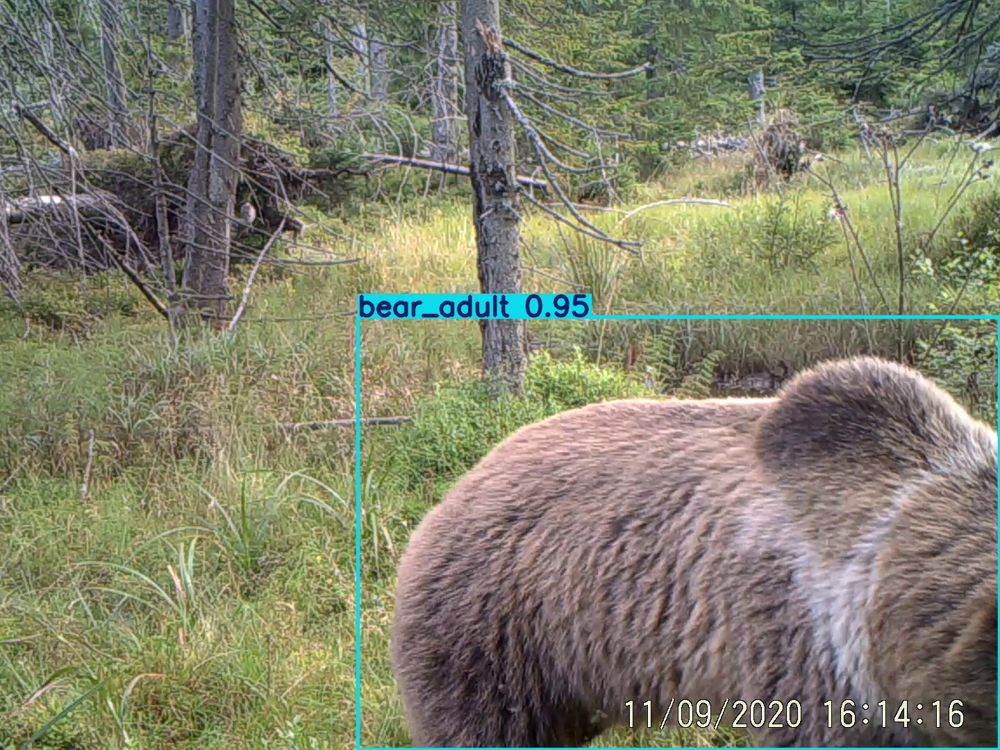


Rezultat za sliku: bear_video_008_frame_0310_DA.jpg


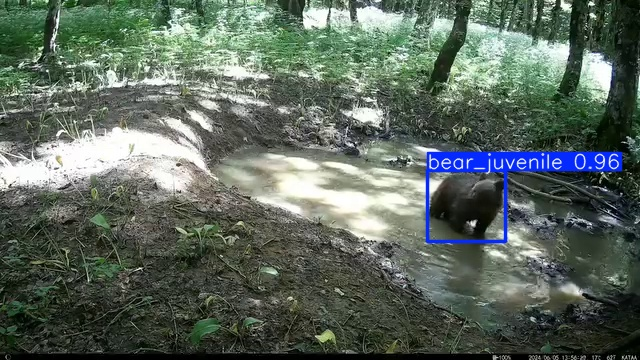


Rezultat za sliku: bear_video_001_frame_0291_EZ.jpg


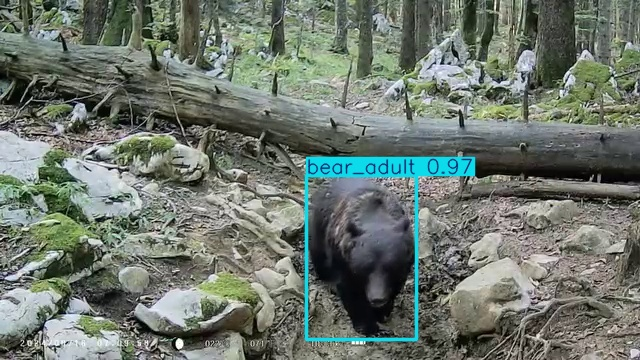


Sve predikcije za test set su završene i prikazane.


In [ ]:
from IPython.display import Image, display
import os
import shutil
import random

best_model_path = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/best.pt'
model = YOLO(best_model_path)

test_images_path = '/content/yolo_data_raw/yolo_dataset/test/images'
results_save_dir = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/test_set_predictions'

if not os.path.exists(test_images_path) or not os.listdir(test_images_path):
    print("Test set folder nije pronađen ili je prazan. Prekidam izvršavanje.")
else:
    if os.path.exists(results_save_dir):
        shutil.rmtree(results_save_dir)
    os.makedirs(results_save_dir)
    print(f"Rezultati će biti sačuvani u: {results_save_dir}")

    test_image_files = os.listdir(test_images_path)
    print(f"\nPronađeno {len(test_image_files)} slika u test setu. Počinjem predikciju...")

    model.predict(
        source=test_images_path,
        save=True,
        project=results_save_dir,
        name='predictions',
        exist_ok=True
    )

    prediction_images_path = os.path.join(results_save_dir, 'predictions')

    print("\n--- Prikaz 5 nasumičnih rezultata detekcije ---")

    all_prediction_files = [f for f in os.listdir(prediction_images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    random_images = random.sample(all_prediction_files, min(5, len(all_prediction_files)))

    for image_file in random_images:
        print(f"\nRezultat za sliku: {image_file}")
        display(Image(filename=os.path.join(prediction_images_path, image_file)))

print("\nSve predikcije za test set su završene i prikazane.")


Prikaz grafova nakon evaluacije nad testnim skupom


--- Prikaz nakon treninga grafova ---

Grafik: F1_curve.png


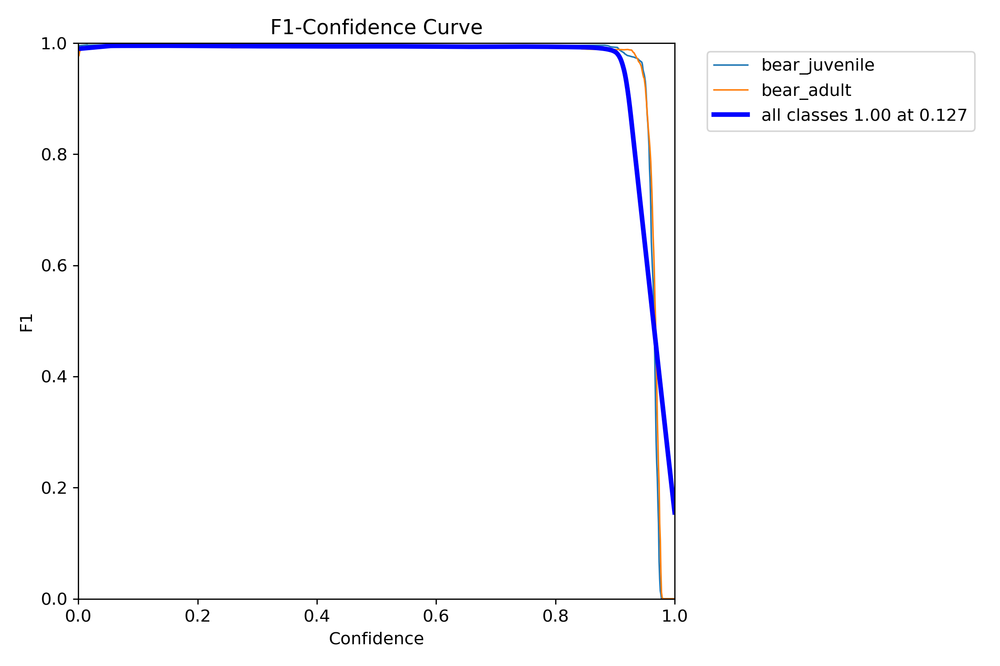


Grafik: PR_curve.png


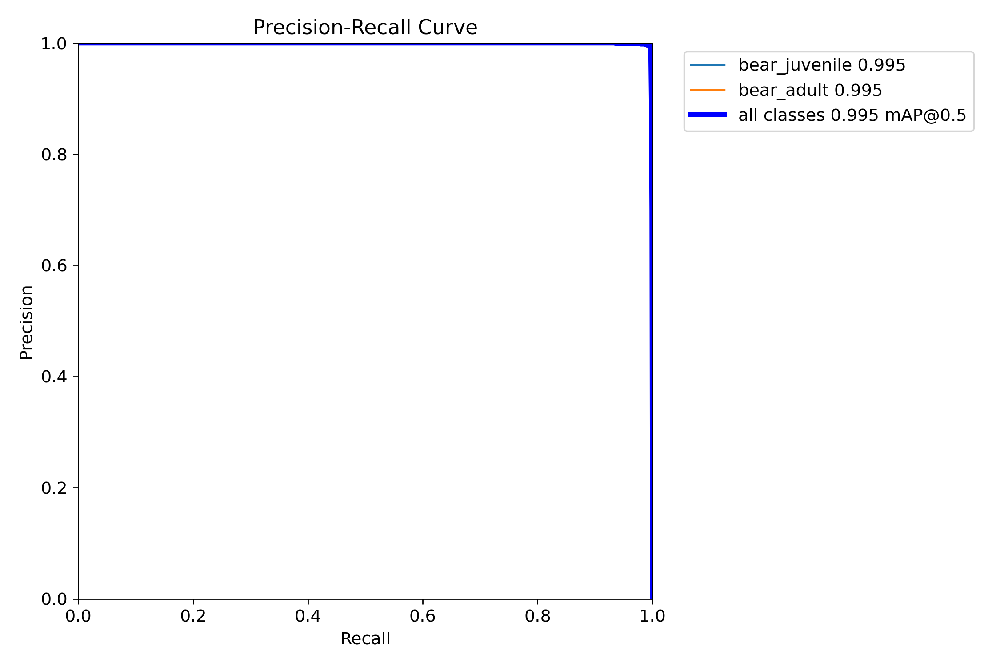


Grafik: P_curve.png


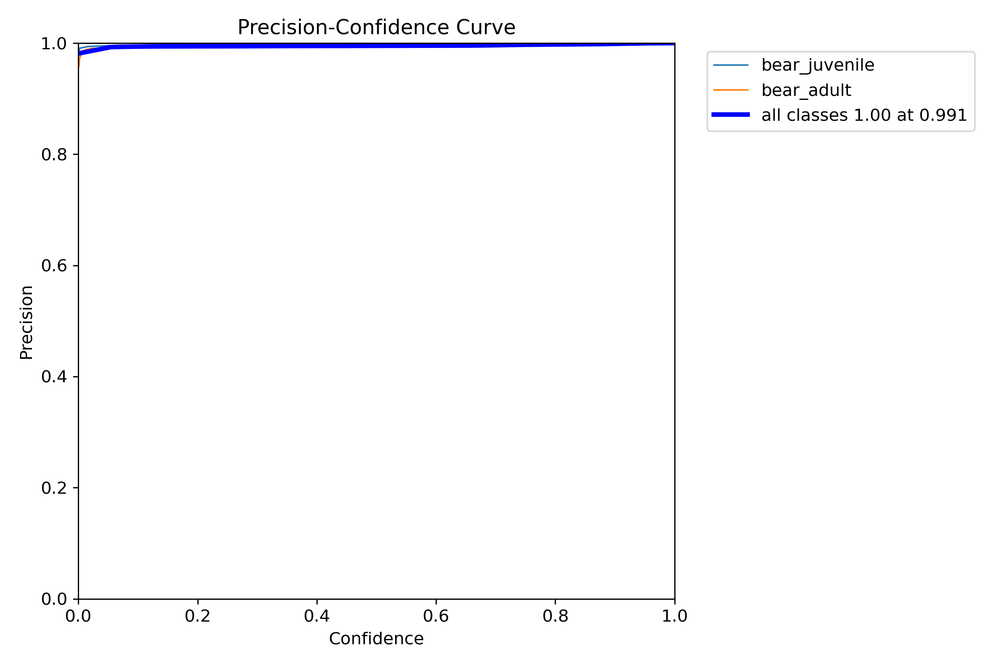


Grafik: R_curve.png


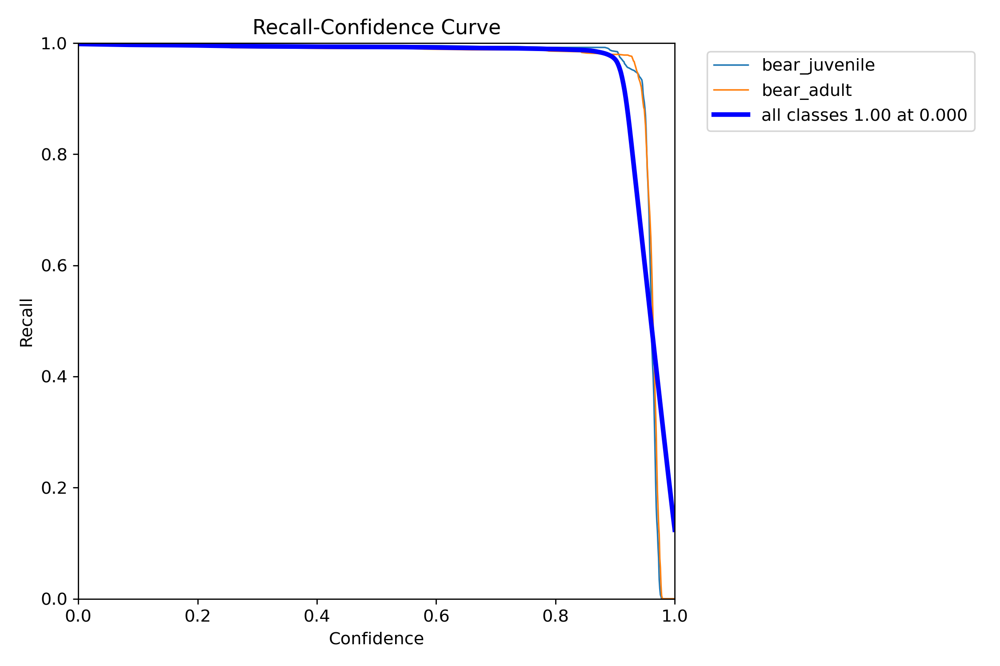


Grafik: confusion_matrix.png


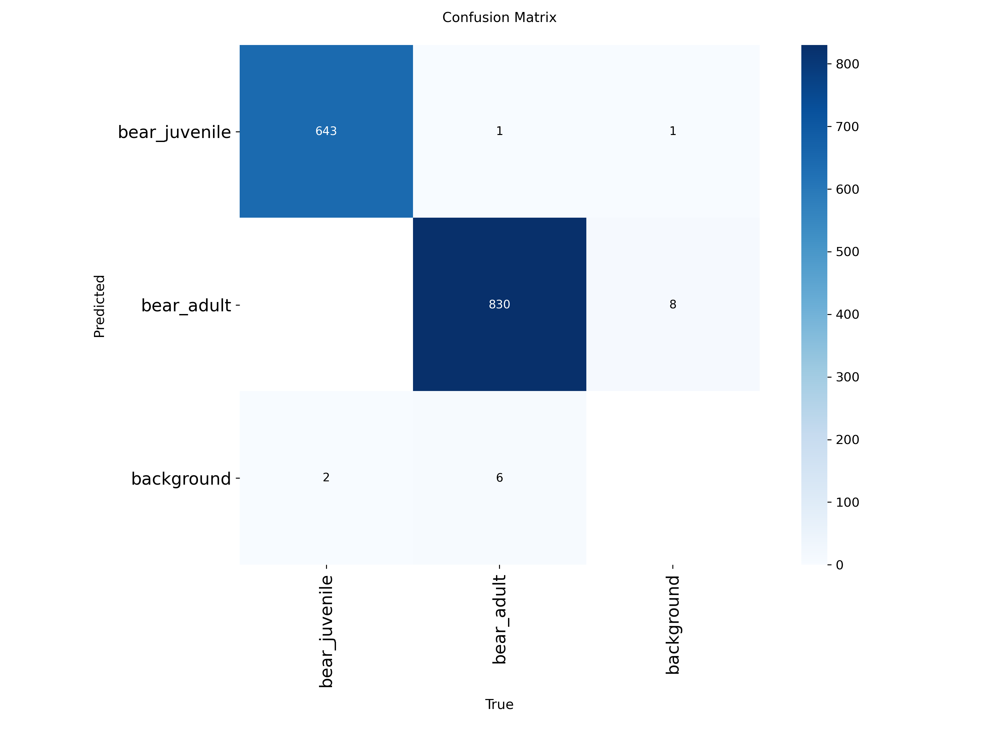


Grafik: confusion_matrix_normalized.png


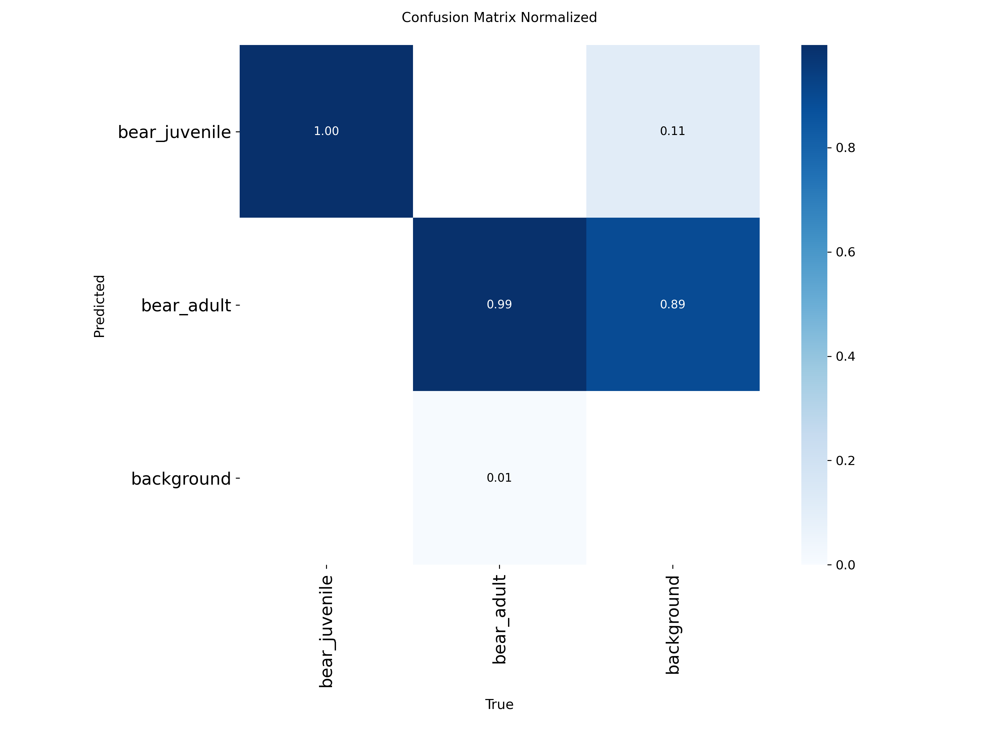


Grafik: val_batch0_labels.jpg


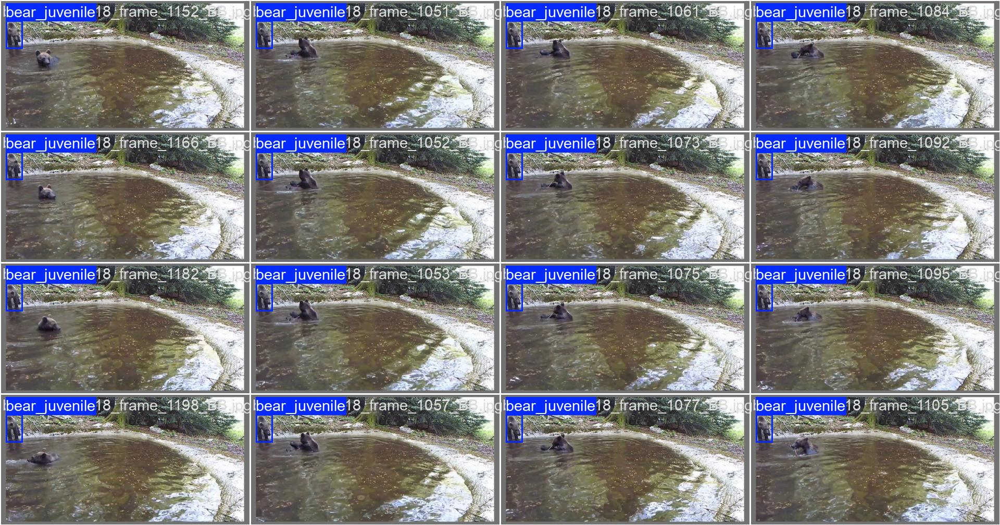


Grafik: val_batch0_pred.jpg


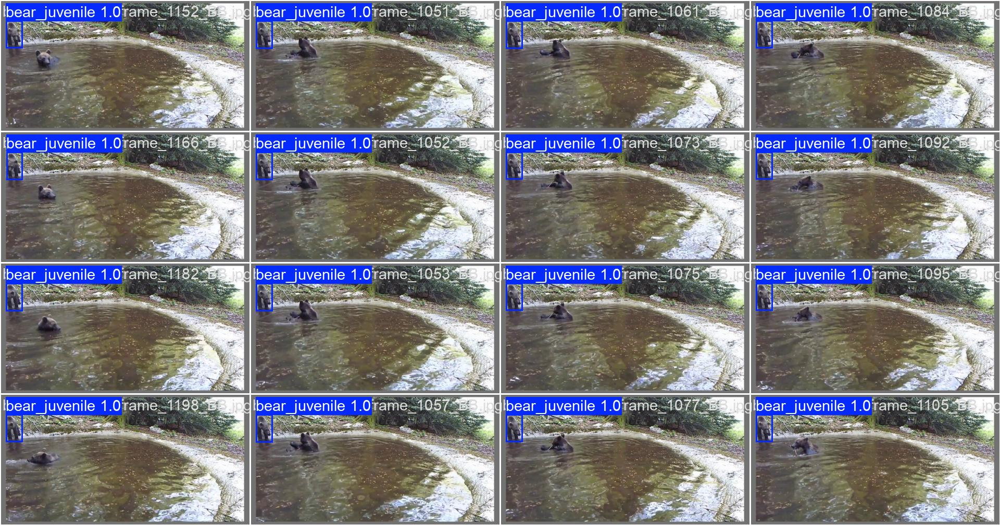


Grafik: val_batch1_labels.jpg


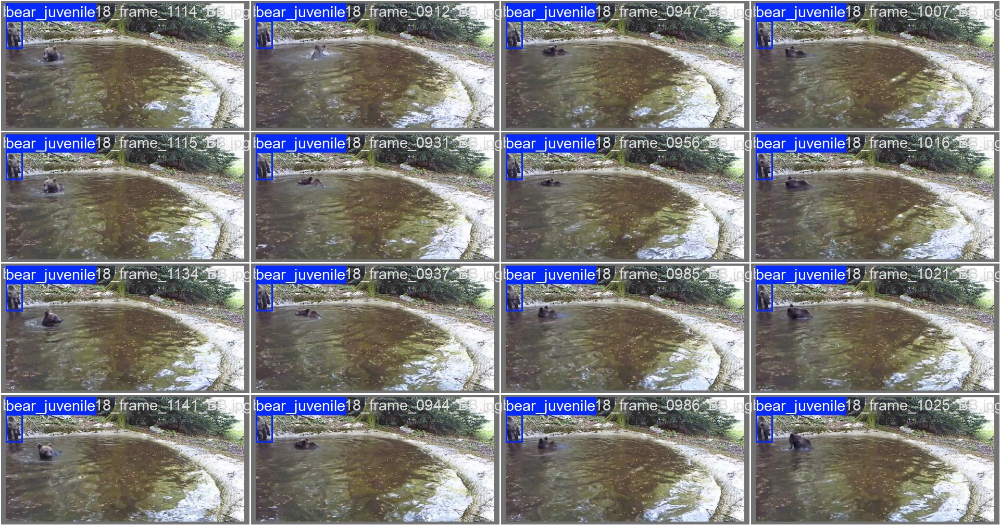


Grafik: val_batch1_pred.jpg


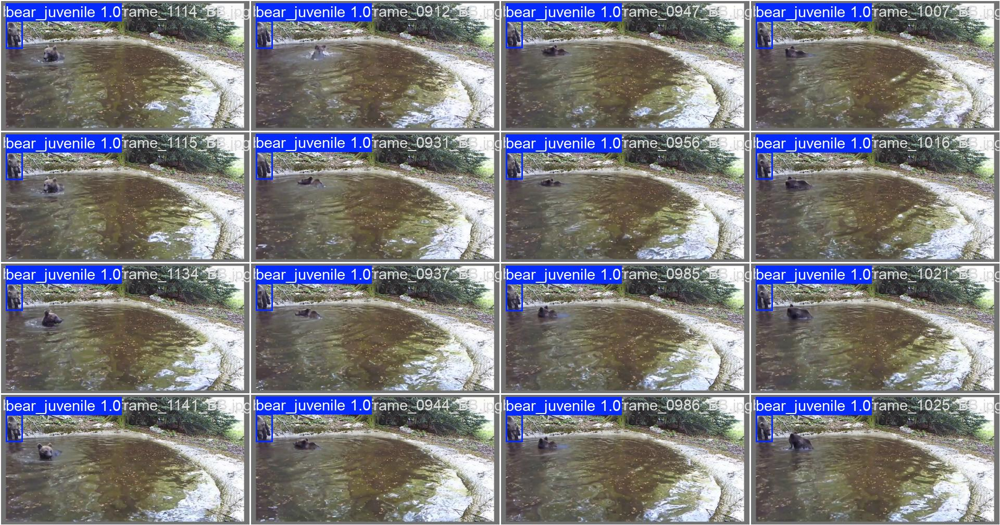


Grafik: val_batch2_labels.jpg


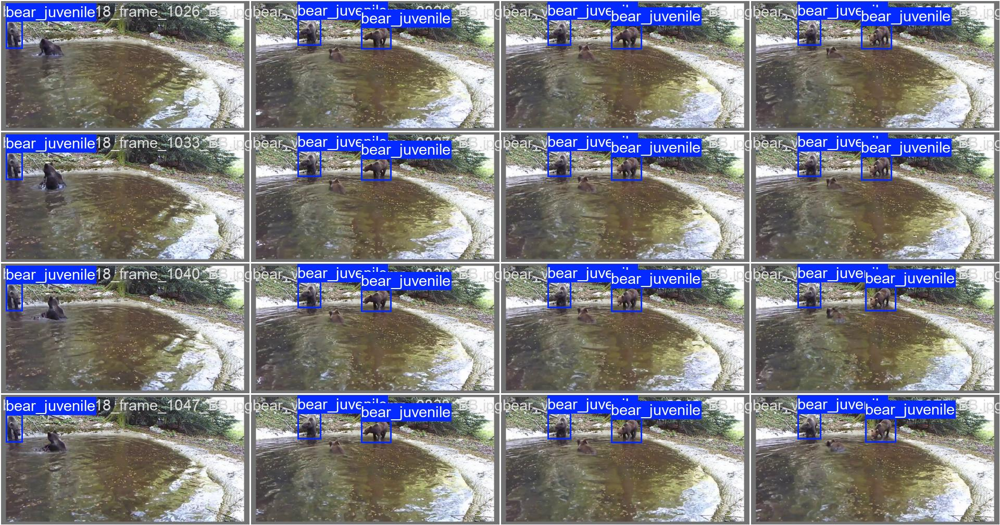


Grafik: val_batch2_pred.jpg


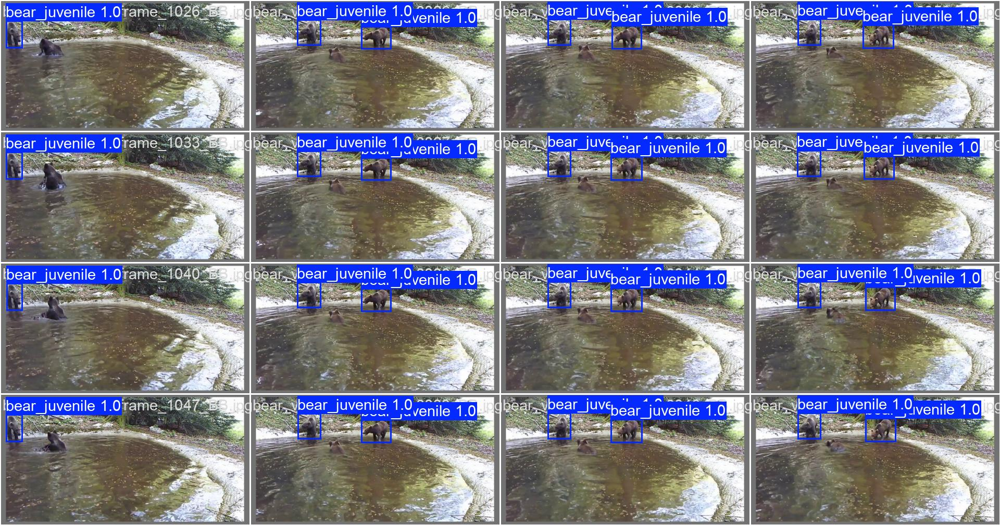


Svi grafici su prikazani.


In [7]:
from IPython.display import Image, display
import os

# Putanja do foldera sa evaluacionim grafovima
evaluation_path = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive_test_evaluation'

print("\n--- Prikaz nakon treninga grafova ---")

# Sortiraj fajlove za konzistentan prikaz
for image_file in sorted(os.listdir(evaluation_path)):
    if image_file.endswith(('.jpg', '.jpeg', '.png')):
        print(f"\nGrafik: {image_file}")
        display(Image(filename=os.path.join(evaluation_path, image_file), width=800))

print("\nSvi grafici su prikazani.")


Prikaz grafova nakon treninga na datasetu


--- Prikaz nakon treninga grafova ---

Grafik: F1_curve.png


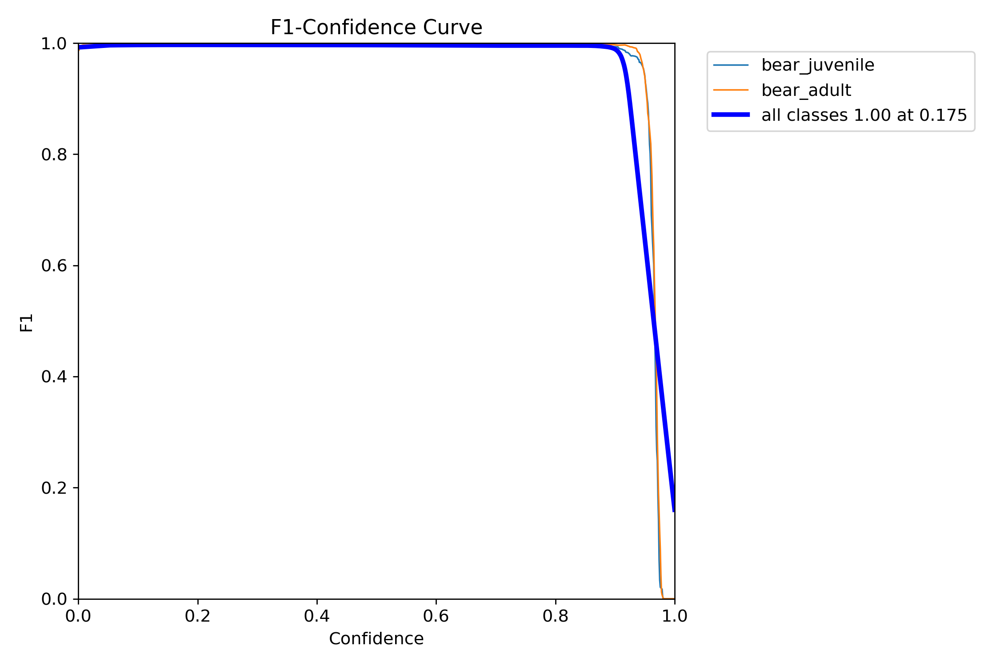


Grafik: PR_curve.png


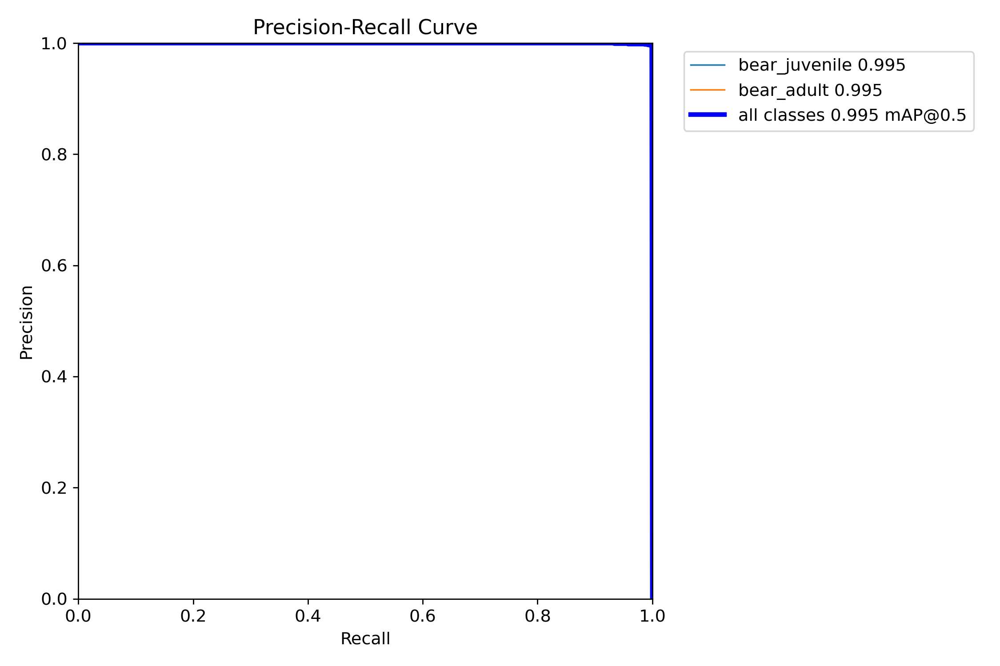


Grafik: P_curve.png


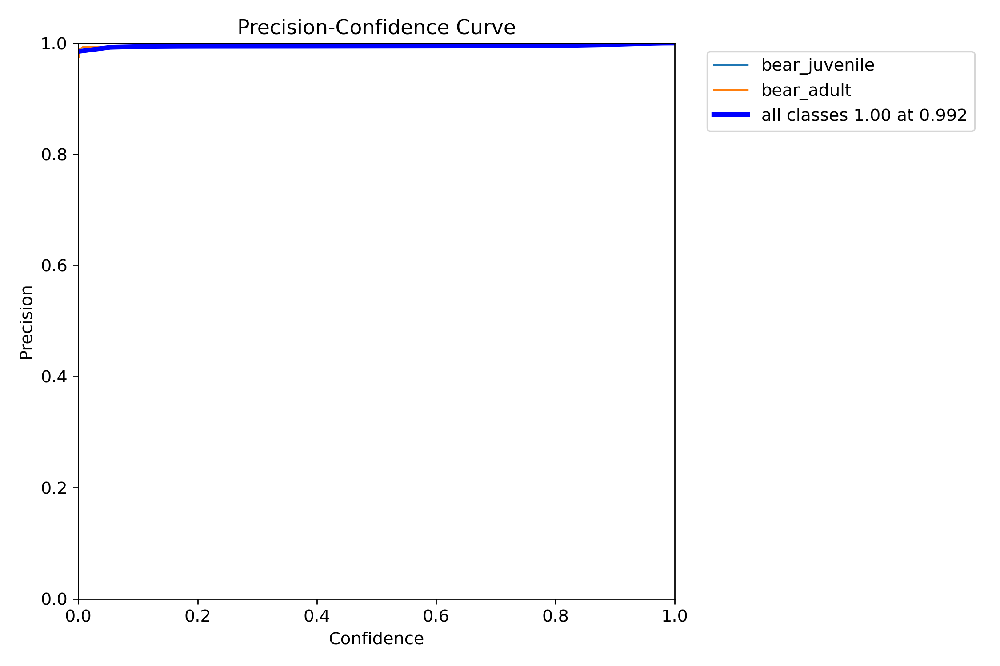


Grafik: R_curve.png


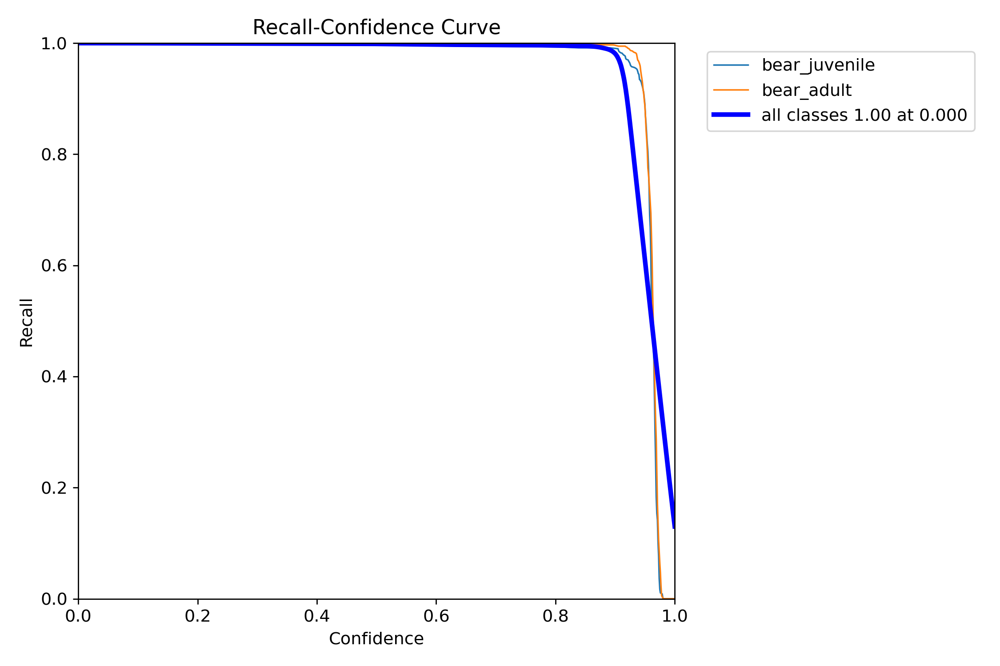


Grafik: confusion_matrix.png


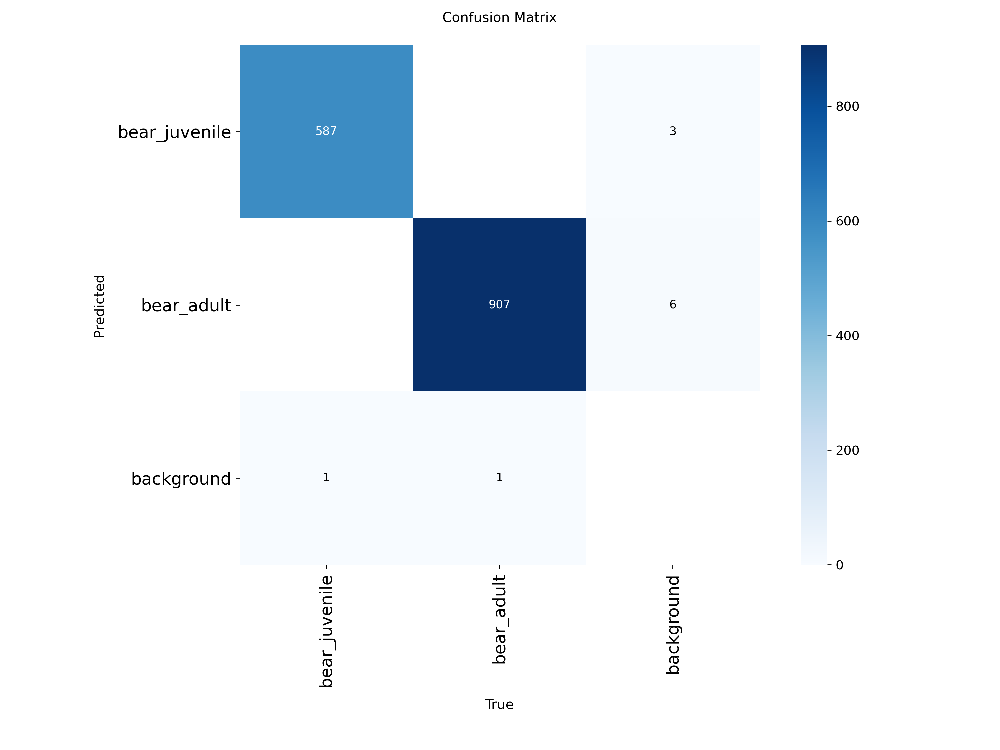


Grafik: confusion_matrix_normalized.png


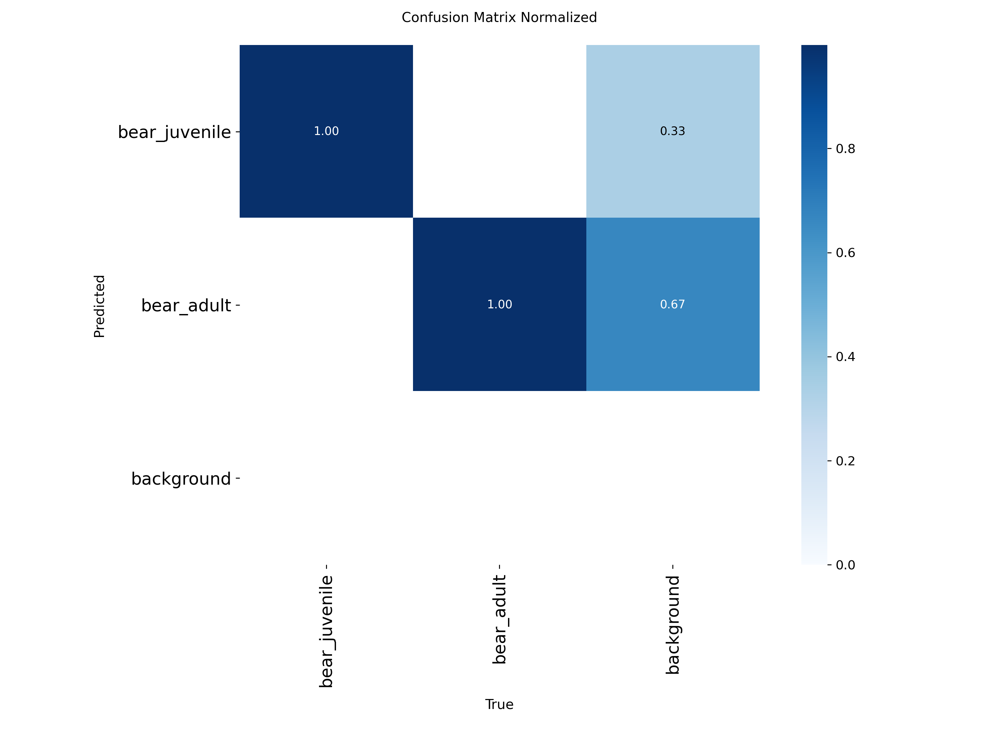


Grafik: labels.jpg


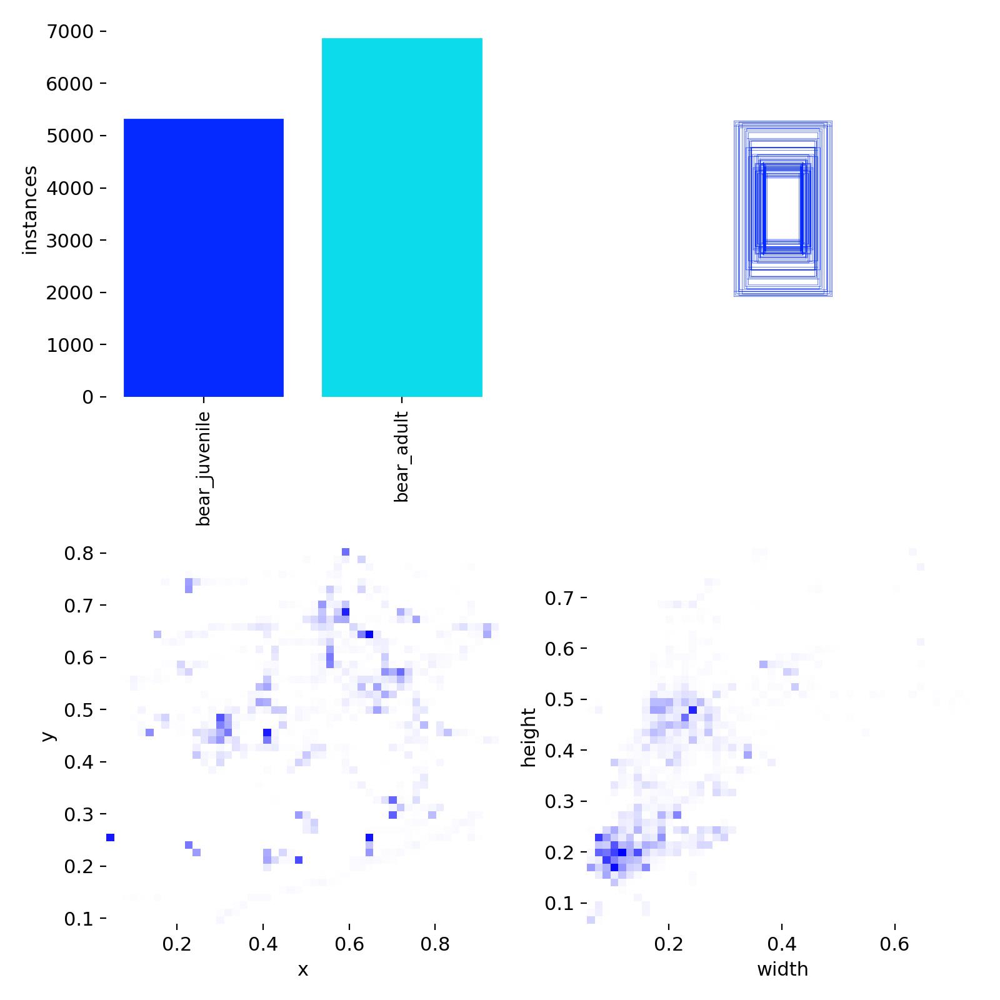


Grafik: labels_correlogram.jpg


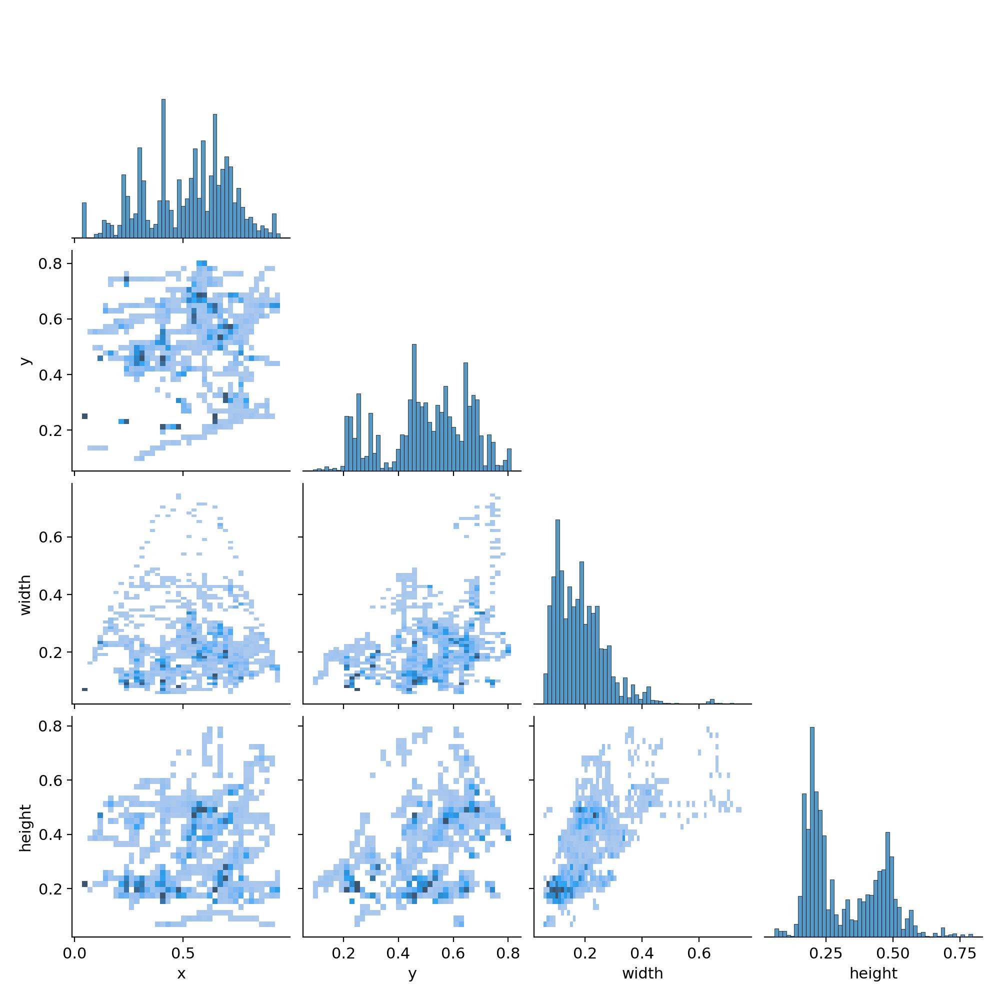


Grafik: results.png


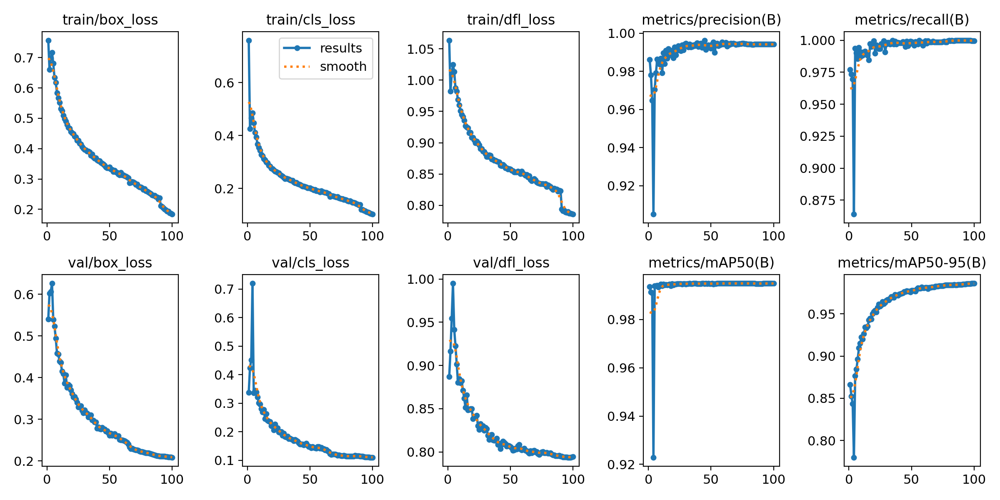


Grafik: train_batch0.jpg


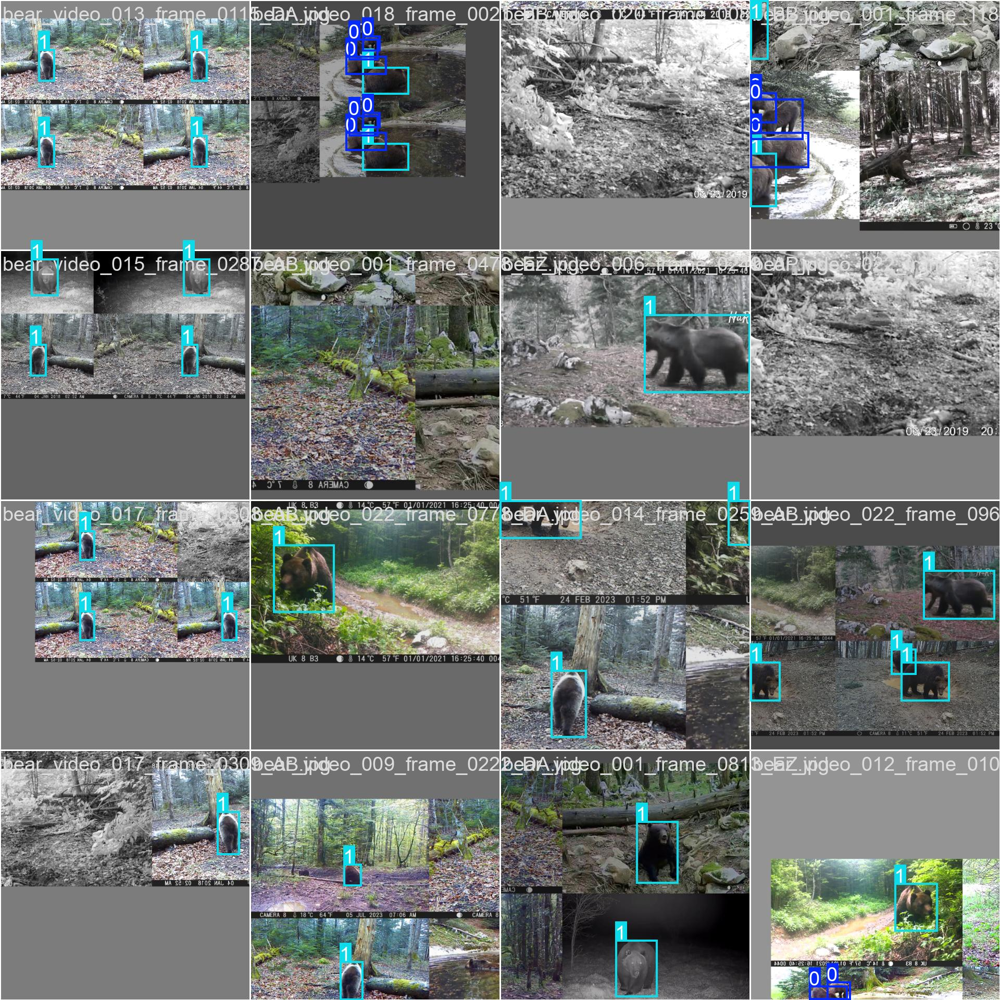


Grafik: train_batch1.jpg


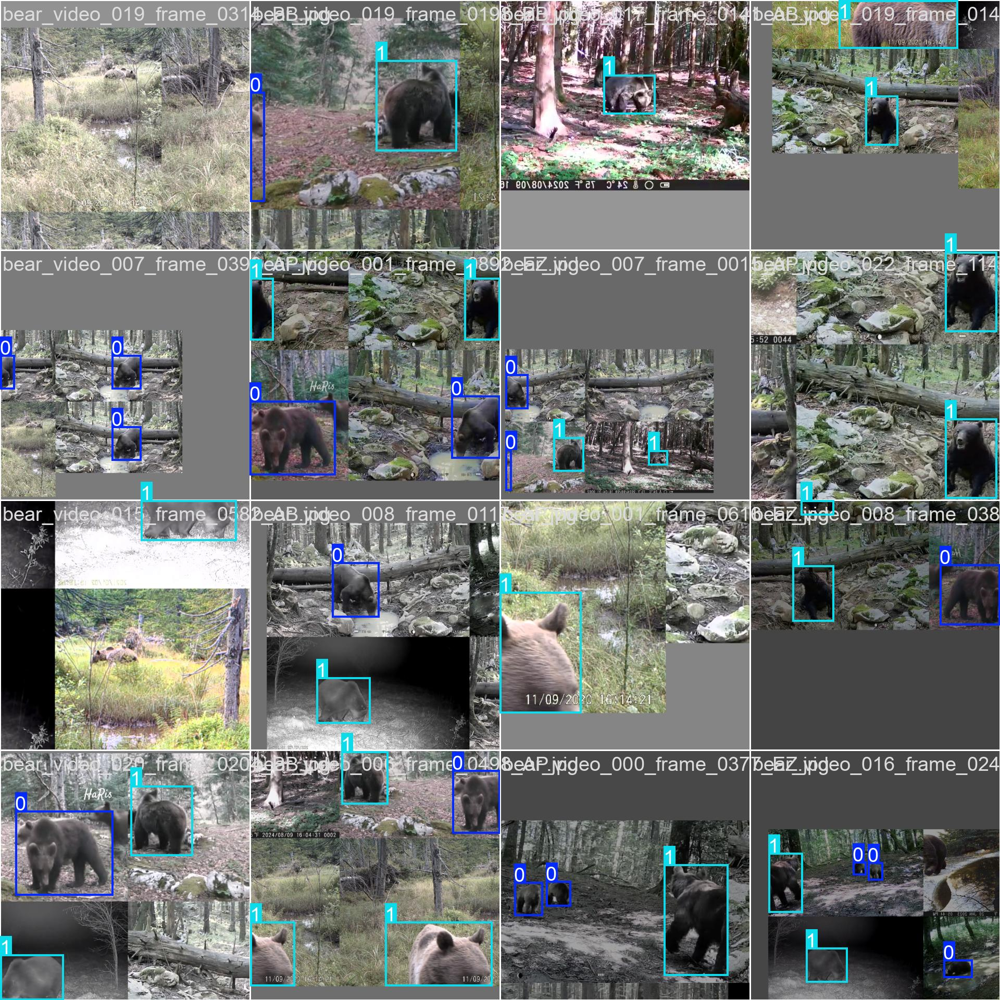


Grafik: train_batch2.jpg


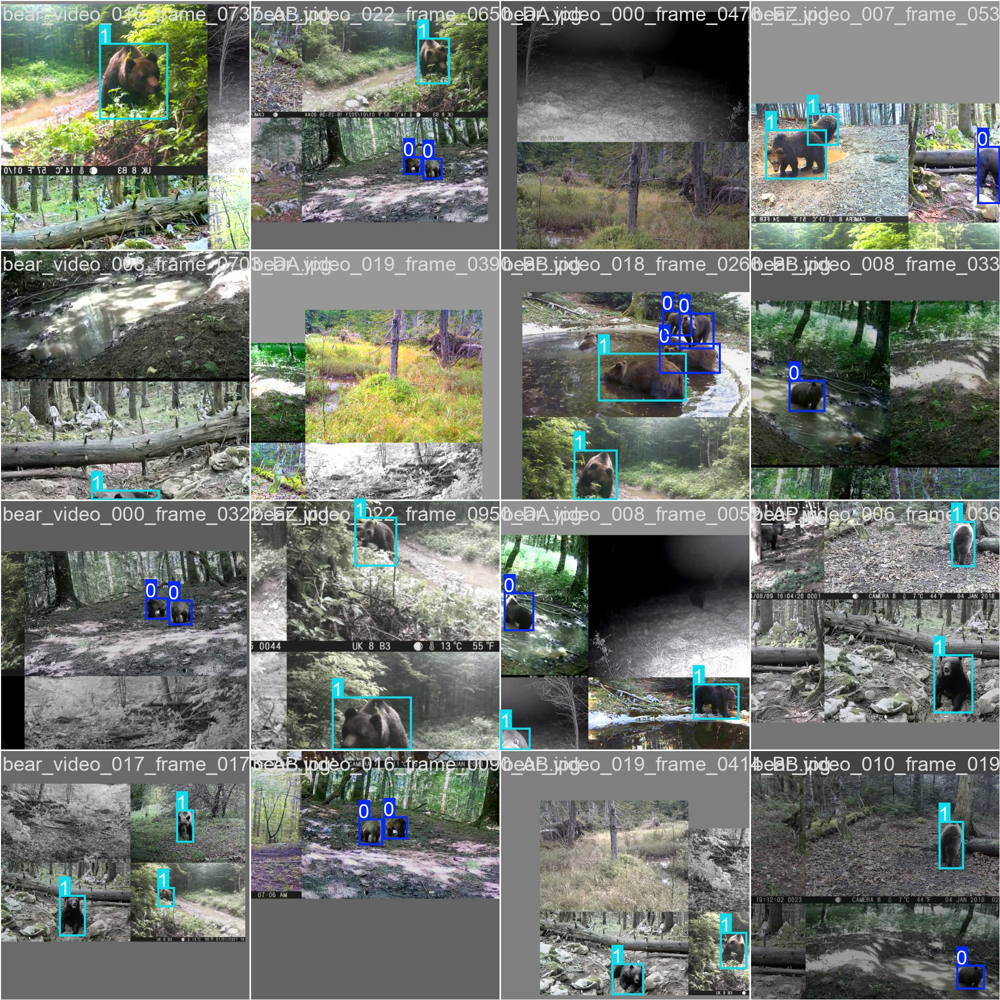


Grafik: train_batch53820.jpg


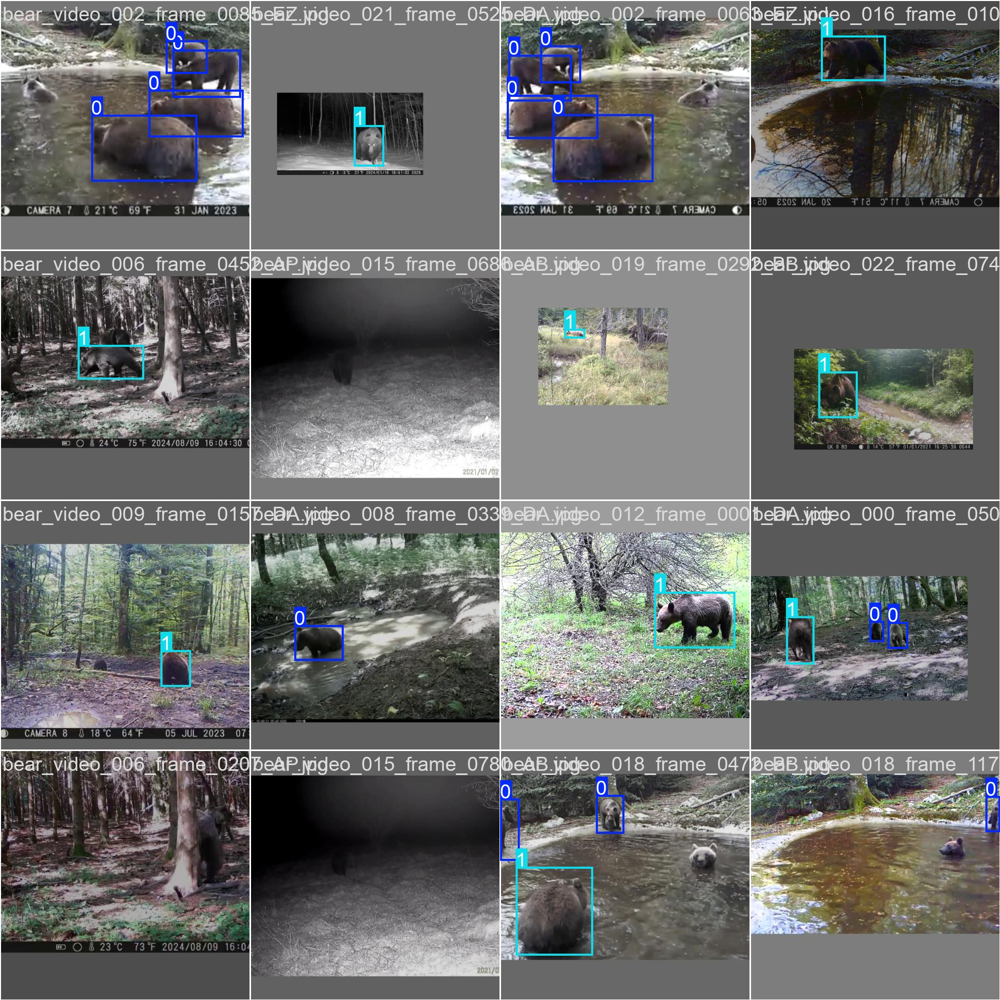


Grafik: train_batch53821.jpg


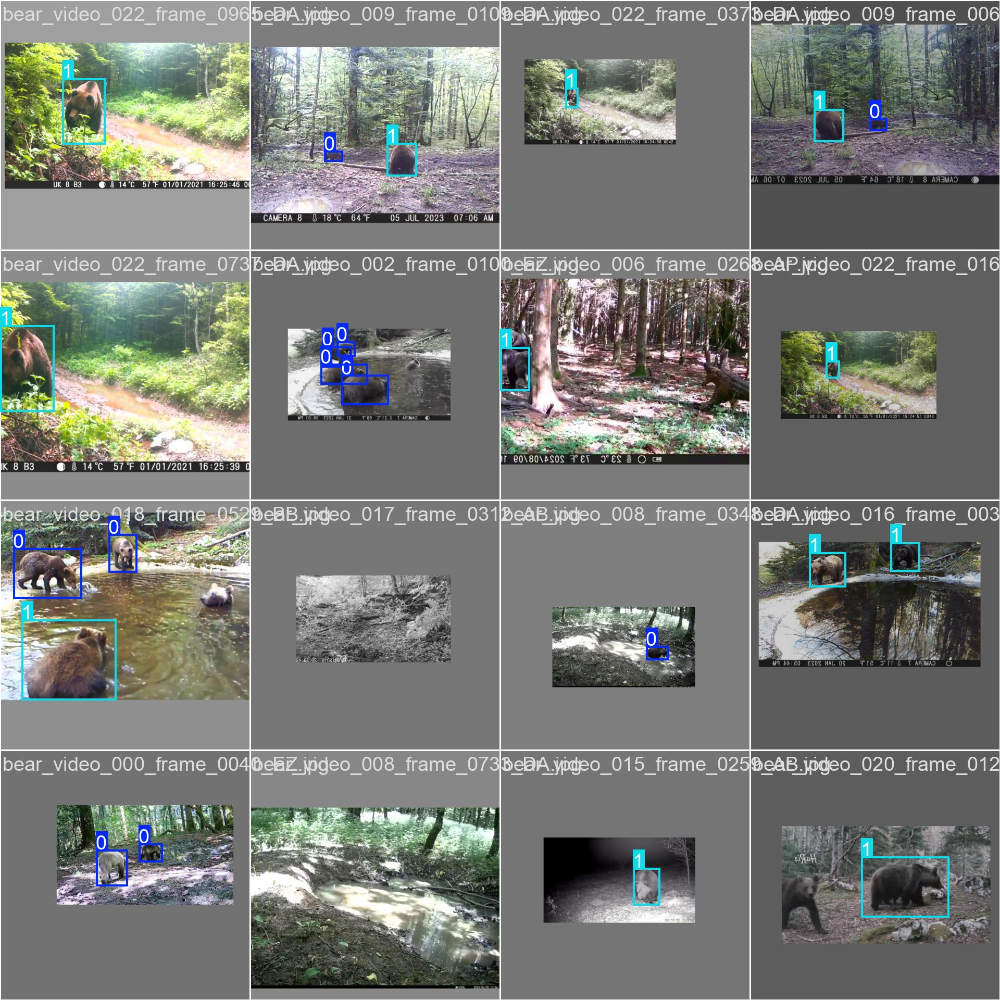


Grafik: train_batch53822.jpg


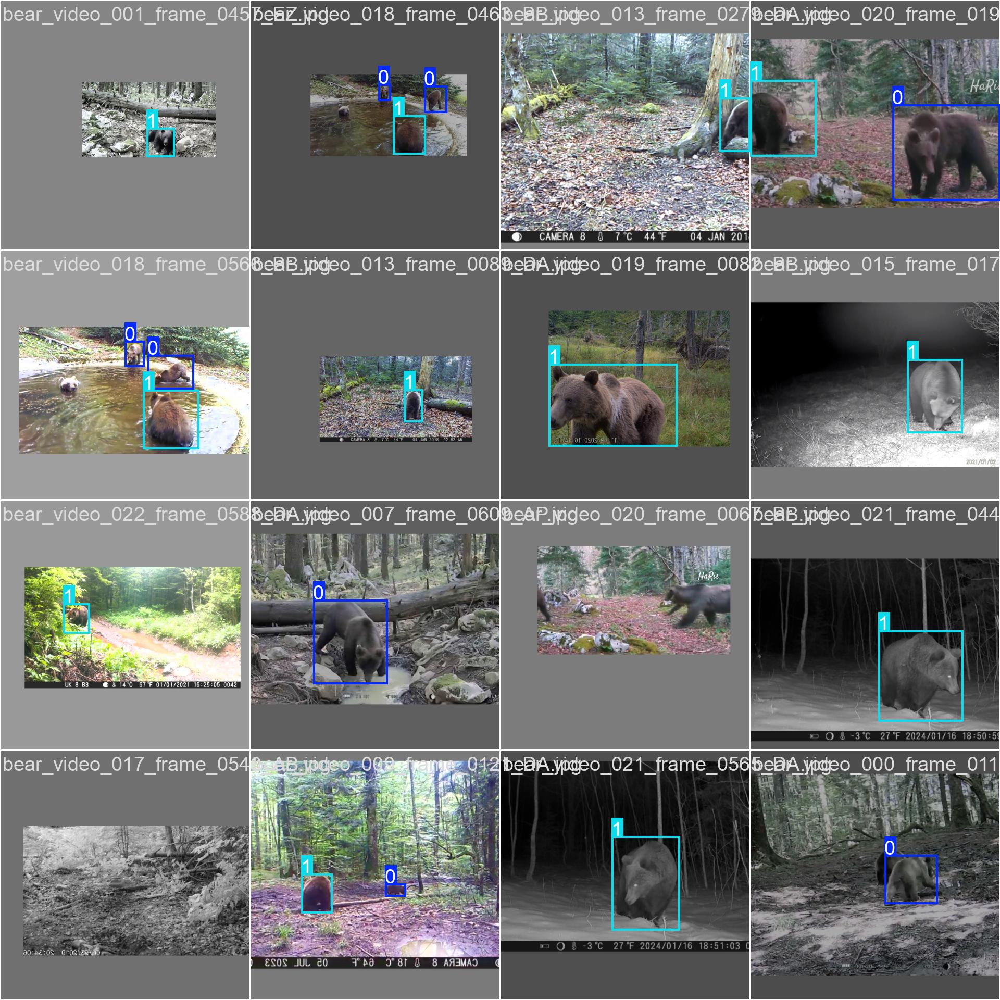


Grafik: val_batch0_labels.jpg


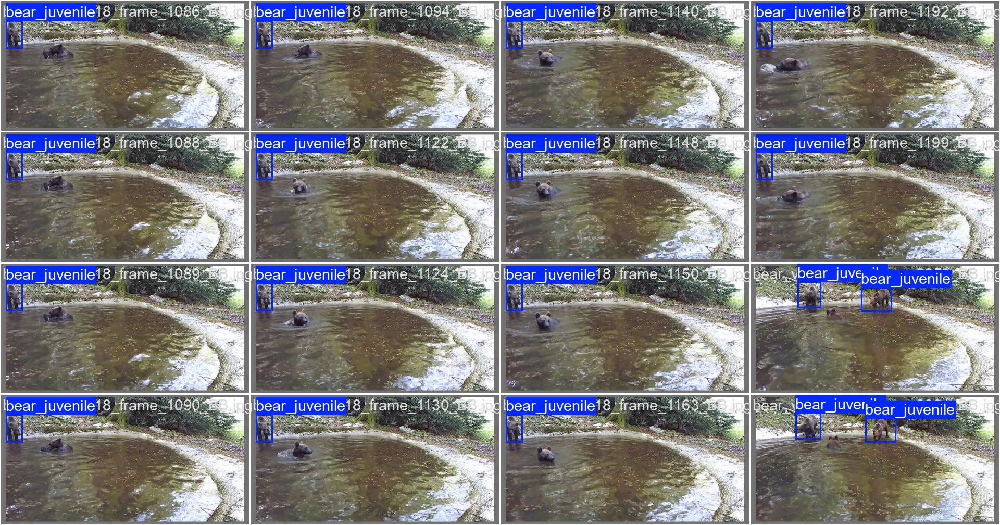


Grafik: val_batch0_pred.jpg


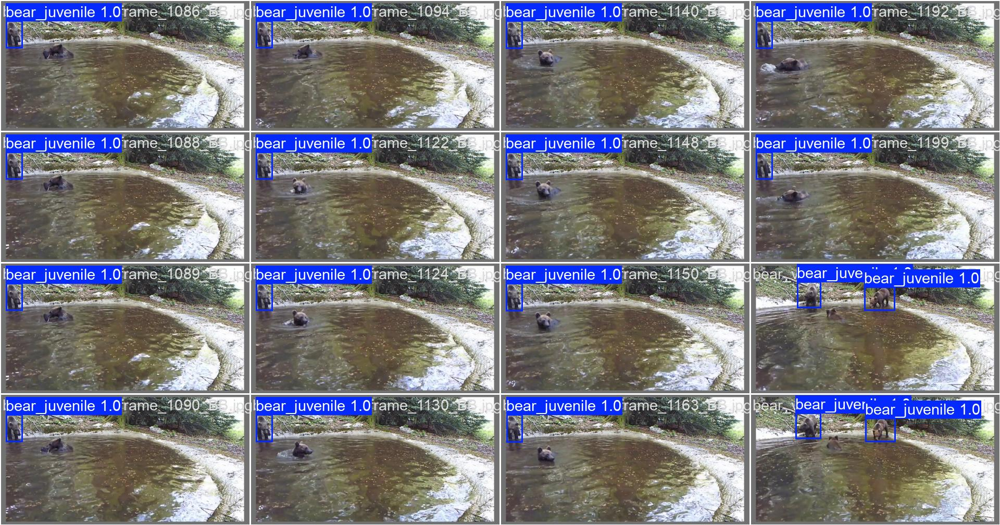


Grafik: val_batch1_labels.jpg


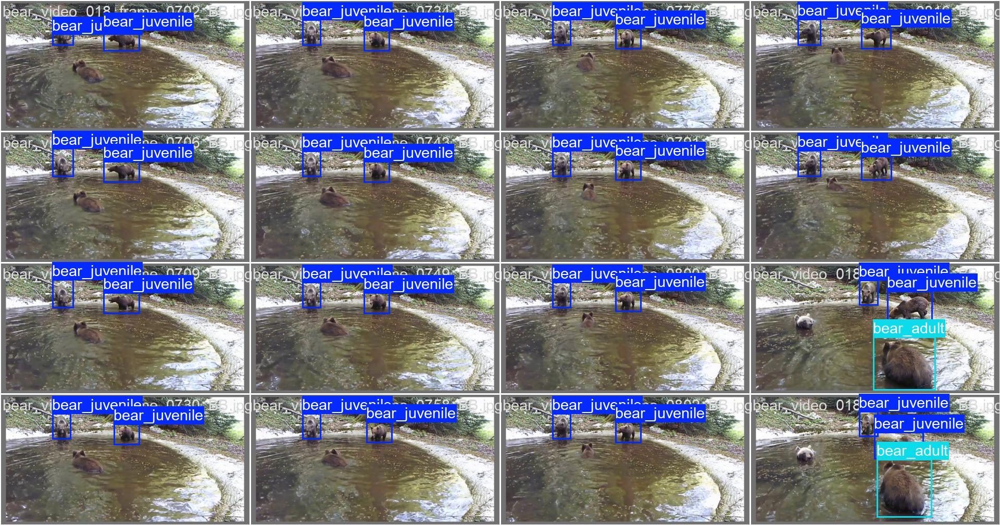


Grafik: val_batch1_pred.jpg


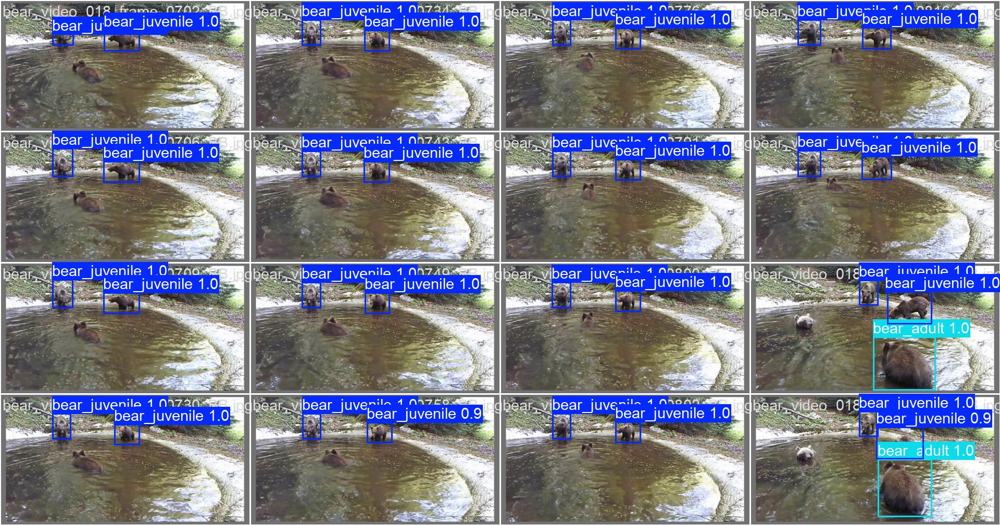


Grafik: val_batch2_labels.jpg


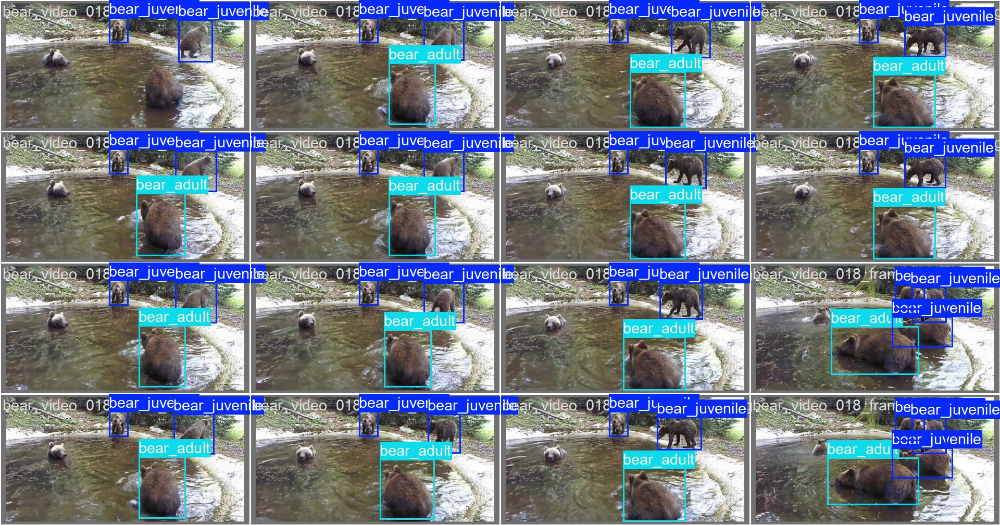


Grafik: val_batch2_pred.jpg


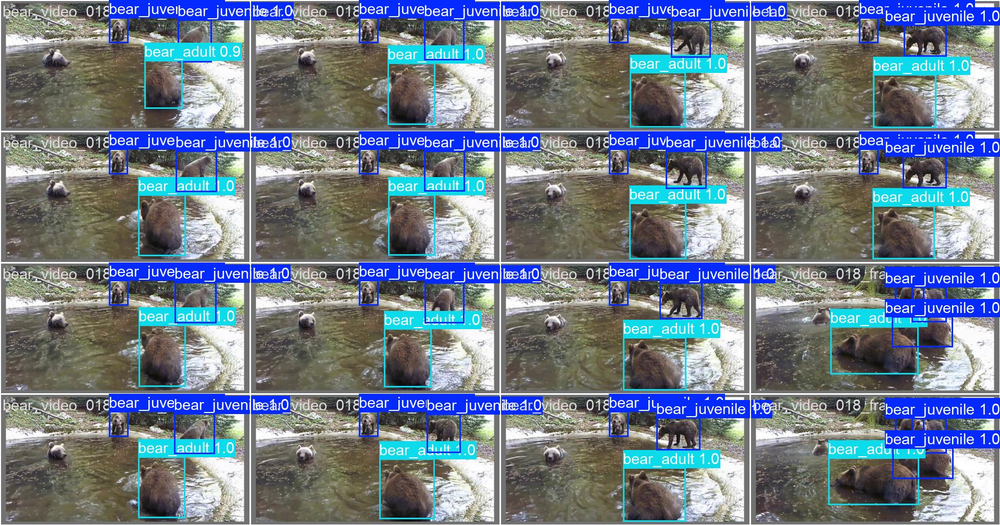


Svi grafici su prikazani.


In [8]:
from IPython.display import Image, display
import os

# Putanja do foldera sa evaluacionim grafovima
evaluation_path = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive'

print("\n--- Prikaz nakon treninga grafova ---")

# Sortiraj fajlove za konzistentan prikaz
for image_file in sorted(os.listdir(evaluation_path)):

    if image_file.endswith(('.jpg', '.jpeg', '.png')):
        print(f"\nGrafik: {image_file}")
        display(Image(filename=os.path.join(evaluation_path, image_file), width=800))

print("\nSvi grafici su prikazani.")


#Test nad slikama izvan dataseta

In [ ]:


from IPython.display import Image, display
import os
import shutil


best_model_path = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/best.pt'
model = YOLO(best_model_path)


test_images_path = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/test_slike'

results_save_dir = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/test_slike_prediction'


if not os.path.exists(test_images_path) or not os.listdir(test_images_path):
    print("Test set folder nije pronađen ili je prazan. Prekidam izvršavanje.")
else:

    if os.path.exists(results_save_dir):
        shutil.rmtree(results_save_dir)
    os.makedirs(results_save_dir)
    print(f"Rezultati će biti sačuvani u: {results_save_dir}")


    test_image_files = os.listdir(test_images_path)
    print(f"\nPronađeno {len(test_image_files)} slika u test setu. Počinjem predikciju...")


    model.predict(
        source=test_images_path,
        save=True,
        project=results_save_dir,
        name='predictions',
        exist_ok=True
    )


    prediction_images_path = os.path.join(results_save_dir, 'predictions')

    print("\n--- Prikaz rezultata detekcije ---")

    for image_file in sorted(os.listdir(prediction_images_path)):

        if image_file.endswith(('.jpg', '.jpeg', '.png')):
            print(f"\nRezultat za sliku: {image_file}")
            # Prikazujemo sliku
            display(Image(filename=os.path.join(prediction_images_path, image_file)))

print("\nSve predikcije za test set su završene i prikazane.")

#Finalna evaluacija na test setu

Najbolji model uspešno učitan sa: /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive/weights/best.pt

--- Pokretanje evaluacije na TEST setu... ---
Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2269.7±420.6 MB/s, size: 269.4 KB)


val: Scanning /content/yolo_data_raw/yolo_dataset/test/labels.cache... 1196 images, 194 backgrounds, 0 corrupt: 100%|██████████| 1196/1196 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.64it/s]


                   all       1196       1482      0.994      0.997      0.995      0.983
         bear_juvenile        420        645      0.997      0.998      0.995      0.983
            bear_adult        735        837      0.992      0.995      0.995      0.983
Speed: 0.3ms preprocess, 12.4ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive_test_evaluation2

--- Kvantitativni rezultati (Metrike) ---
mAP50-95 (glavna metrika): 0.9833
mAP50 (detekcija na IOU > 0.5): 0.9949
Preciznost (Precision): 0.9967 (za juvenile), 0.9917 (za adult)
Odziv (Recall): 0.9984 (za juvenile), 0.9948 (za adult)
mAP50-95 po klasi: Juvenile=0.9833, Adult=0.9833

--- Pokretanje vizuelne predikcije na nekoliko primera iz TEST seta... ---

image 1/1 /content/yolo_data_raw/yolo_dataset/test/images/bear_video_000_frame_0409_EZ.jpg: 384x640 2 bear_juveniles, 1 bear_adult, 43.7ms
Speed: 2.6ms preprocess, 43.7ms infer

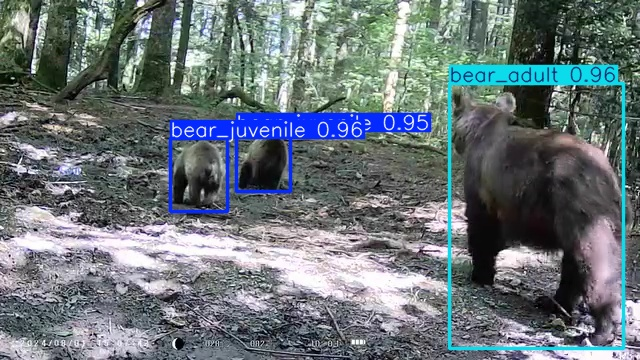


image 1/1 /content/yolo_data_raw/yolo_dataset/test/images/bear_video_022_frame_0221_DA.jpg: 384x640 1 bear_adult, 29.6ms
Speed: 2.5ms preprocess, 29.6ms inference, 8.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive_test_predictions

Rezultat za sliku: bear_video_022_frame_0221_DA.jpg


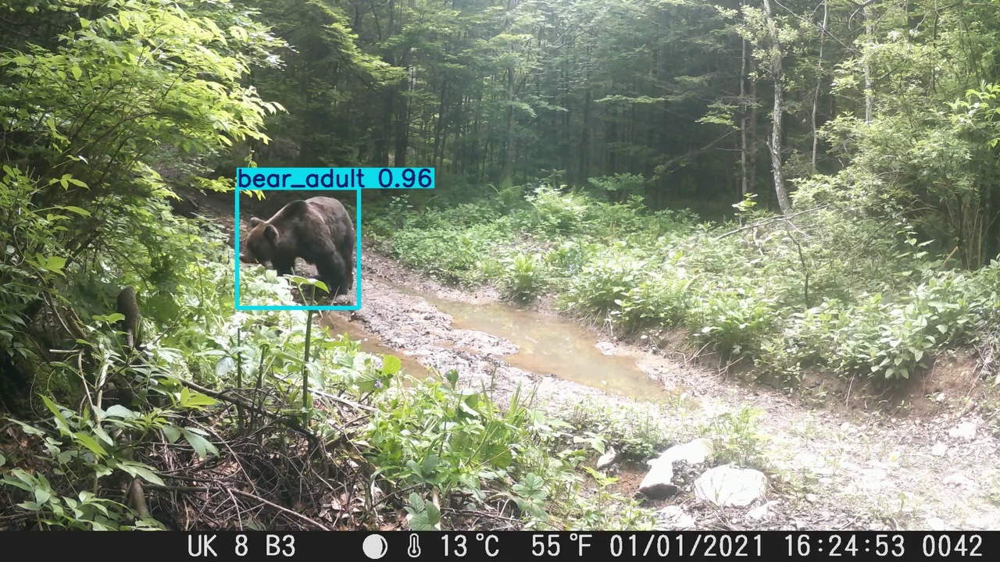


image 1/1 /content/yolo_data_raw/yolo_dataset/test/images/bear_video_002_frame_0144_EZ.jpg: 384x640 4 bear_juveniles, 25.2ms
Speed: 3.6ms preprocess, 25.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive_test_predictions

Rezultat za sliku: bear_video_002_frame_0144_EZ.jpg


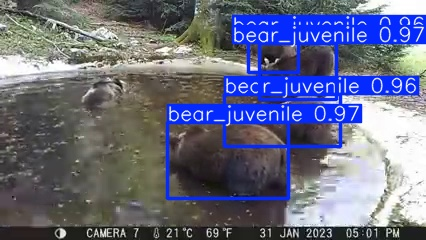


image 1/1 /content/yolo_data_raw/yolo_dataset/test/images/bear_video_022_frame_0963_DA.jpg: 384x640 1 bear_adult, 25.2ms
Speed: 2.2ms preprocess, 25.2ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive_test_predictions

Rezultat za sliku: bear_video_022_frame_0963_DA.jpg


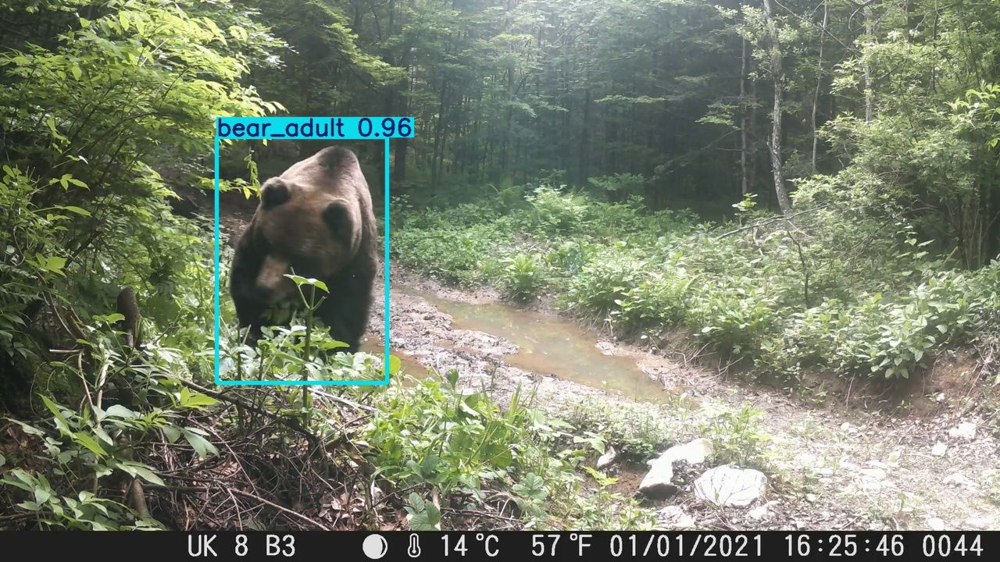


image 1/1 /content/yolo_data_raw/yolo_dataset/test/images/bear_video_002_frame_0000_EZ.jpg: 384x640 4 bear_juveniles, 1 bear_adult, 25.7ms
Speed: 2.4ms preprocess, 25.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive_test_predictions

Rezultat za sliku: bear_video_002_frame_0000_EZ.jpg


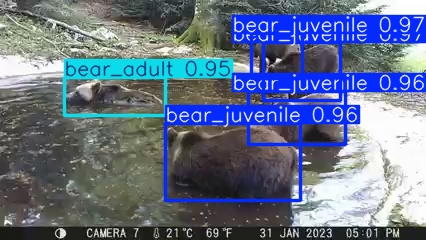


Slike sa predikcijama su sačuvane u: /content/drive/MyDrive/VI-Projekat/Bear_Detection_Project/run_medium_on_drive_test_predictions


In [ ]:


from ultralytics import YOLO
from IPython.display import Image, display
import os
import random



DRIVE_PROJECT_PATH = '/content/drive/MyDrive/VI-Projekat/Bear_Detection_Project'
RUN_NAME = 'run_medium_on_drive'

best_model_path = os.path.join(DRIVE_PROJECT_PATH, RUN_NAME, 'weights/best.pt')

if not os.path.exists(best_model_path):
    print(f"GREŠKA: Model nije pronađen na: {best_model_path}")
else:
    model = YOLO(best_model_path)
    print(f"Najbolji model uspešno učitan sa: {best_model_path}")



    data_config_path = '/content/yolo_data_raw/yolo_dataset/data.yaml'

    print("\n--- Pokretanje evaluacije na TEST setu... ---")
    metrics = model.val(data=data_config_path,
                        split='test',
                        project=DRIVE_PROJECT_PATH,
                        name=f'{RUN_NAME}_test_evaluation')

    print("\n--- Kvantitativni rezultati (Metrike) ---")


    if metrics:
        print(f"mAP50-95 (glavna metrika): {metrics.box.map:.4f}")
        print(f"mAP50 (detekcija na IOU > 0.5): {metrics.box.map50:.4f}")


        p_juvenile = metrics.box.p[0] if len(metrics.box.p) > 0 else 0.0
        p_adult = metrics.box.p[1] if len(metrics.box.p) > 1 else 0.0
        print(f"Preciznost (Precision): {p_juvenile:.4f} (za juvenile), {p_adult:.4f} (za adult)")


        r_juvenile = metrics.box.r[0] if len(metrics.box.r) > 0 else 0.0
        r_adult = metrics.box.r[1] if len(metrics.box.r) > 1 else 0.0
        print(f"Odziv (Recall): {r_juvenile:.4f} (za juvenile), {r_adult:.4f} (za adult)")


        map_juvenile = metrics.box.maps[0] if len(metrics.box.maps) > 0 else 0.0
        map_adult = metrics.box.maps[1] if len(metrics.box.maps) > 1 else 0.0
        print(f"mAP50-95 po klasi: Juvenile={map_juvenile:.4f}, Adult={map_adult:.4f}")



    print("\n--- Pokretanje vizuelne predikcije na nekoliko primera iz TEST seta... ---")
    test_images_path = '/content/yolo_data_raw/yolo_dataset/test/images'

    try:
        random_test_images = random.sample(os.listdir(test_images_path), 5)
    except (ValueError, FileNotFoundError):
        if os.path.exists(test_images_path):
             random_test_images = os.listdir(test_images_path)
        else:
            random_test_images = []
            print("Test images folder nije pronađen.")

    if random_test_images:
        for image_name in random_test_images:
            image_path = os.path.join(test_images_path, image_name)

            results = model.predict(source=image_path,
                                    save=True,
                                    project=DRIVE_PROJECT_PATH,
                                    name=f'{RUN_NAME}_test_predictions',
                                    exist_ok=True,
                                    conf=0.4
                                   )

            print(f"\nRezultat za sliku: {image_name}")
            prediction_image_path = os.path.join(DRIVE_PROJECT_PATH, f'{RUN_NAME}_test_predictions', image_name)

            if os.path.exists(prediction_image_path):
                 display(Image(filename=prediction_image_path))
            else:
                print("Nije bilo moguće prikazati sliku, ali predikcija je izvršena.")

        print(f"\nSlike sa predikcijama su sačuvane u: {os.path.join(DRIVE_PROJECT_PATH, f'{RUN_NAME}_test_predictions')}")